In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import RandomizedSearchCV

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

import catboost
from catboost import *
from catboost.utils import eval_metric

import textwrap

import shap
shap.initjs()

import jenkspy

from BorutaShap import BorutaShap
mpl.rcParams.update({'font.size':13})

In [2]:
df = pd.read_csv("./Data/All_Parameter_CSV.csv", index_col=0).sort_values(by='NAME10').drop_duplicates('NAME10').reset_index(drop=True)
svi_2020 = pd.read_csv('Data/svi_2020.csv', index_col=0).sort_values(by='NAME10')

In [3]:
df.drop(['Socioeconomic\xa0Status', 'Household Composition & Disability', 'Minority Status & Language',
       'Housing Type & Transportation', 'Diabetes'], axis=1, inplace=True)

In [4]:
df = df.merge(right=svi_2020, left_on='NAME10', right_on='NAME10', how='inner')

In [5]:
df

,TRACTCE10,GEOID10,NAME10,NAMELSAD10,Long,Lat,State,County,Smoking,Binge Drinking,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Crime,EP_AFAM,EP_HISP,EP_ASIAN,EP_AIAN,SVI
0,10100,17031010100,101.00,Census Tract 101,-87.669844,42.021262,ILLINOIS,Cook,16.4,13.8,...,0.7721,0.5522,0.7028,0.9275,13132,35.0,15.2,2.0,0.0,0.8544
1,10201,17031010200,102.01,Census Tract 102.01,-87.680149,42.016008,ILLINOIS,Cook,20.5,13.9,...,0.7859,0.7549,0.7832,0.9966,10777,33.7,23.4,5.4,0.1,0.9681
2,10202,17031010200,102.02,Census Tract 102.02,-87.673322,42.016050,ILLINOIS,Cook,19.1,13.4,...,0.9211,0.6130,0.7866,0.9991,12830,32.5,26.3,6.3,0.0,0.9911
3,10300,17031010300,103.00,Census Tract 103,-87.666535,42.015941,ILLINOIS,Cook,14.5,14.2,...,0.7681,0.2998,0.6767,0.9757,10431,29.2,15.0,2.4,0.1,0.8400
4,10400,17031010400,104.00,Census Tract 104,-87.657167,42.005440,ILLINOIS,Cook,11.9,16.6,...,0.6916,0.1262,0.5161,0.9721,7052,18.6,7.9,4.4,0.0,0.7110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791,843500,17031843500,8435.00,Census Tract 8435,-87.696754,41.838215,ILLINOIS,Cook,30.4,16.5,...,0.9883,0.0713,0.8649,0.8741,6966,64.7,24.4,0.3,0.0,0.8403
792,843600,17031843600,8436.00,Census Tract 8436,-87.608949,41.806765,ILLINOIS,Cook,15.7,11.0,...,0.8157,0.6563,0.9189,0.6004,9594,87.4,6.1,0.3,0.0,0.8001
793,843700,17031843700,8437.00,Census Tract 8437,-87.690788,41.944827,ILLINOIS,Cook,11.8,17.7,...,0.3019,0.2730,0.5499,0.4423,5841,2.6,21.5,7.5,0.0,0.3357
794,843800,17031843800,8438.00,Census Tract 8438,-87.640476,41.801657,ILLINOIS,Cook,20.6,12.3,...,0.8750,0.8369,0.8133,0.0983,9032,57.2,14.6,4.7,0.0,0.6732


In [6]:
df_minorities = df[['NAME10', 'EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'EP_AIAN']]
df_svi = df[['NAME10', 'SVI']]

In [37]:
df=df.rename(columns={"Solar_DNI":"Direct Normal Irradiation"})

In [38]:
rearranged_columns = ['TRACTCE10',
                      'GEOID10',
                      'NAME10',
                      'NAMELSAD10',
                      'Long',
                      'Lat',
                      'State',
                      'County',
                      'Smoking',
                      'Binge Drinking',
                      'Physical Inactivity',
                      'Sleep<7hours',
                      'Opioid Overdose',
                      'High Cholesterol',
                      'Obesity',
                      'High Blood Pressure',
                      'Depression',
                      'Kidney Diseases',
                      'Land Surface Temperature',
                      'Air Temperature',
                      'Direct Normal Irradiation',
                      'Wind Speed',
                      'Precipitation',
                      'Socioeconomic Status',
                      'Household Characteristics',
                      'Racial & Ethnic Minority Status',
                      'Housing Type & Transportation',
                      'Aerosol ',
                      'Nitrogen Dioxide ',
                      'Carbon Monoxide ',
                      'Sulfur Dioxide ',
                      'Formaldehyde ',
                      'Ozone ',
                      'Crime']

In [39]:
df_all_param = df[rearranged_columns]

In [202]:
df_parameters = df_all_param.iloc[:,8:]

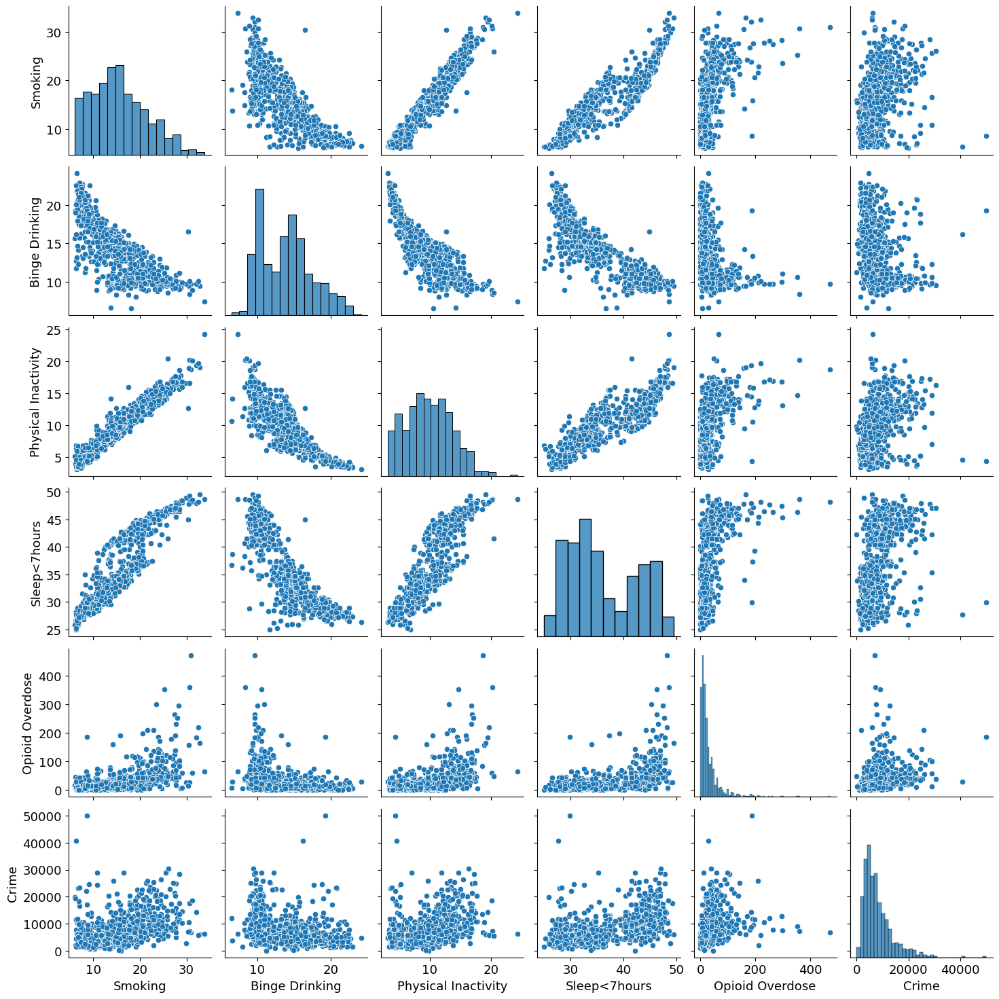

In [10]:
sns.pairplot(df_parameters[['Smoking', 'Binge Drinking', 'Physical Inactivity', 
                            'Sleep<7hours', 'Opioid Overdose', 'Crime']])
plt.savefig('EDA Behavior and Crime.png', dpi=300, bbox_inches='tight')
plt.show()

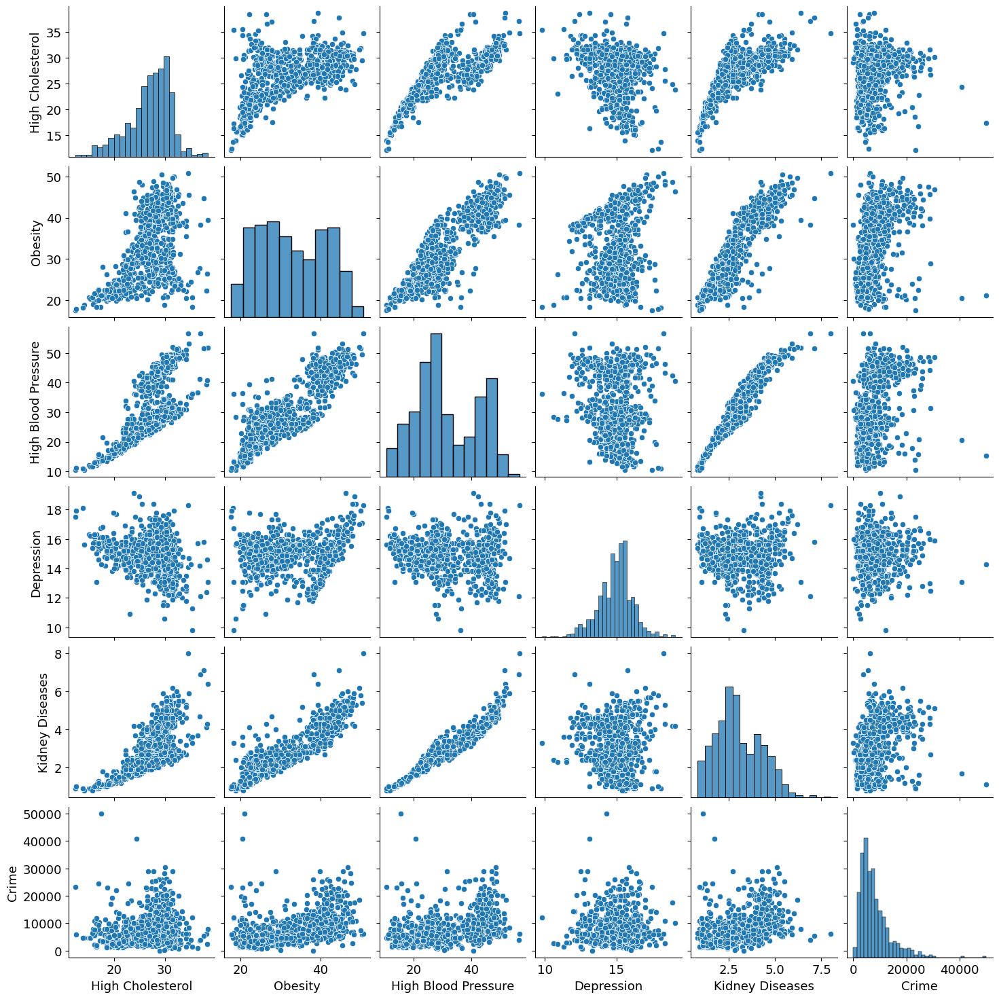

In [11]:
sns.pairplot(df_parameters[['High Cholesterol', 'Obesity', 'High Blood Pressure',
                            'Depression', 'Kidney Diseases', 'Crime']])
plt.savefig('EDA Health and Crime.png', dpi=300, bbox_inches='tight')
plt.show()

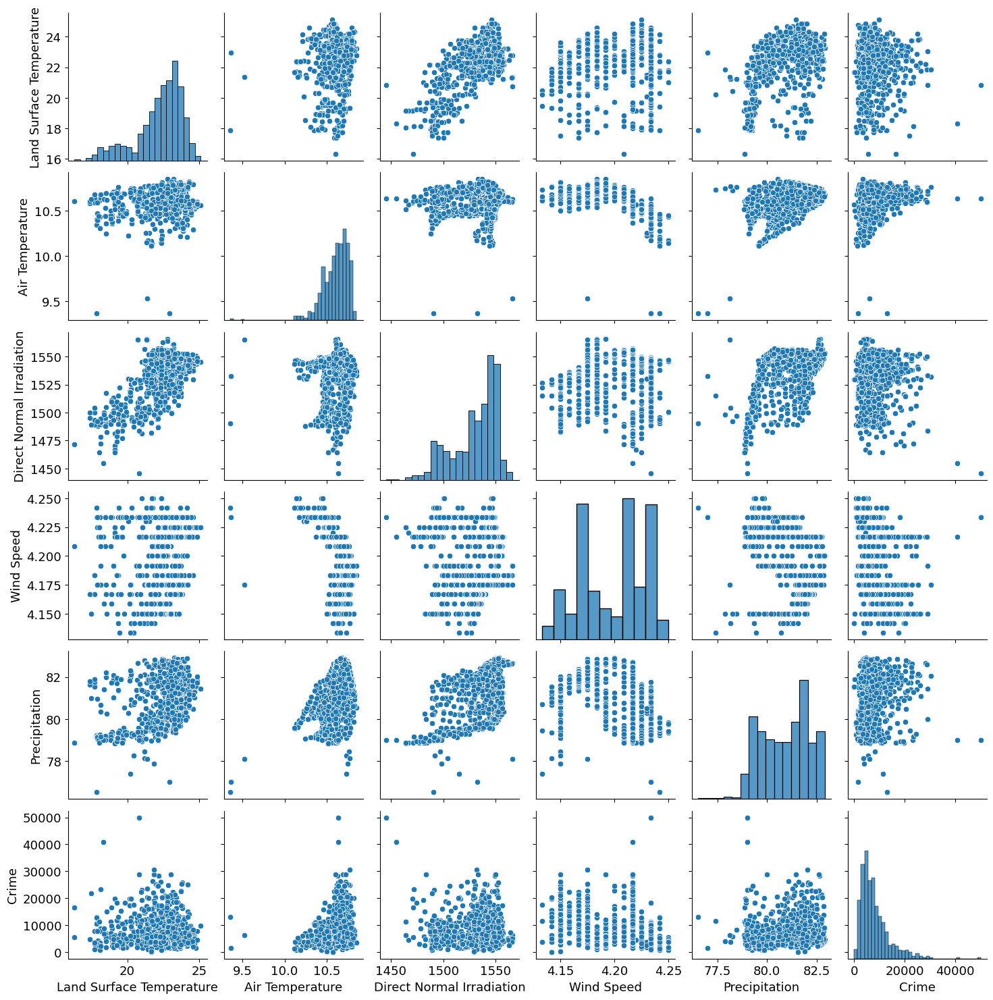

In [12]:
sns.pairplot(df_parameters[['Land Surface Temperature',
       'Air Temperature', 'Direct Normal Irradiation', 'Wind Speed',
       'Precipitation', 'Crime']])
plt.savefig('EDA Weather and Crime.png', dpi=300, bbox_inches='tight')
plt.show()

In [13]:
df_parameters.columns

Index(['Smoking', 'Binge Drinking', 'Physical Inactivity', 'Sleep<7hours',
       'Opioid Overdose', 'High Cholesterol', 'Obesity', 'High Blood Pressure',
       'Depression', 'Kidney Diseases', 'Land Surface Temperature',
       'Air Temperature', 'Direct Normal Irradiation', 'Wind Speed',
       'Precipitation', 'Socioeconomic Status', 'Household Characteristics',
       'Racial & Ethnic Minority Status', 'Housing Type & Transportation',
       'Aerosol ', 'Nitrogen Dioxide ', 'Carbon Monoxide ', 'Sulfur Dioxide ',
       'Formaldehyde ', 'Ozone ', 'Crime'],
      dtype='object')

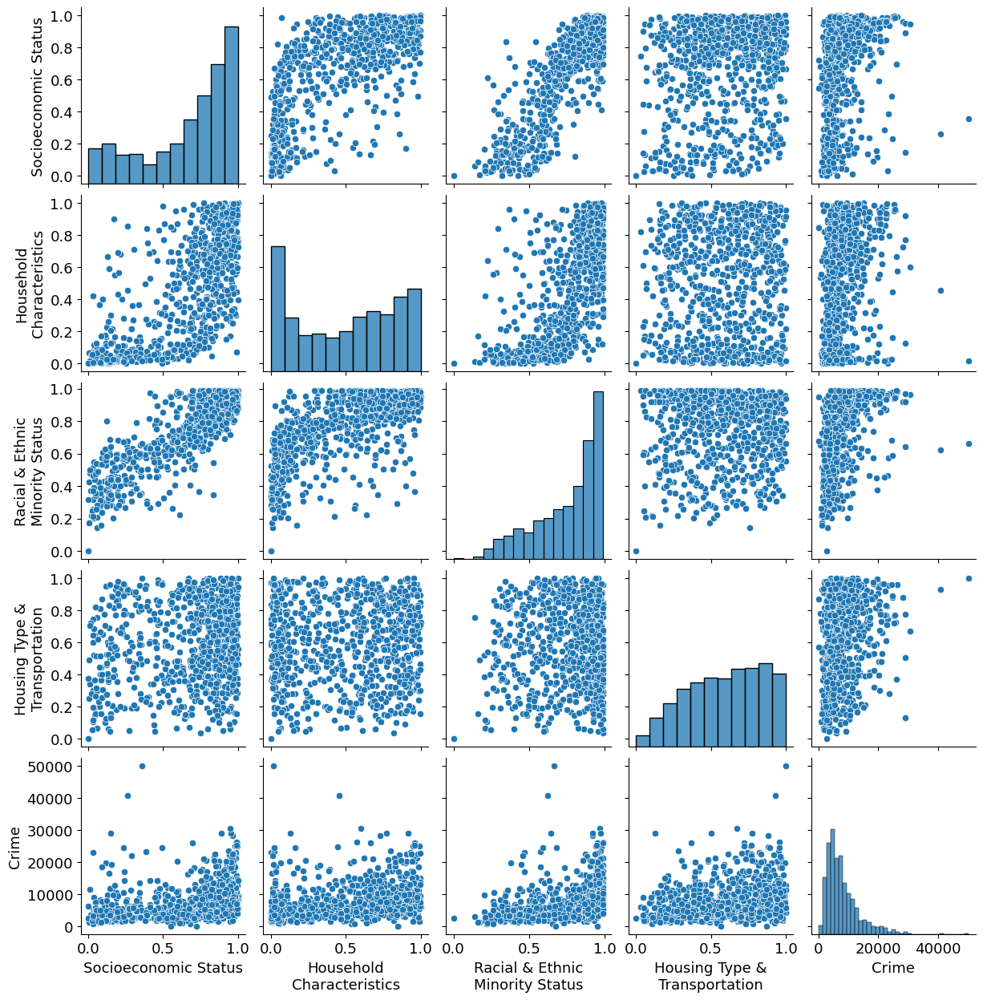

In [14]:
import textwrap

g = sns.pairplot(df_parameters[['Socioeconomic Status', 'Household Characteristics',
       'Racial & Ethnic Minority Status', 'Housing Type & Transportation', 'Crime']])

for ax in g.axes.flat:
    ax.set_xlabel("\n".join(textwrap.wrap(ax.get_xlabel(), width=20)))
    ax.set_ylabel("\n".join(textwrap.wrap(ax.get_ylabel(), width=20)))

plt.savefig('EDA SVI and Crime.png', dpi=300, bbox_inches='tight')
plt.show()

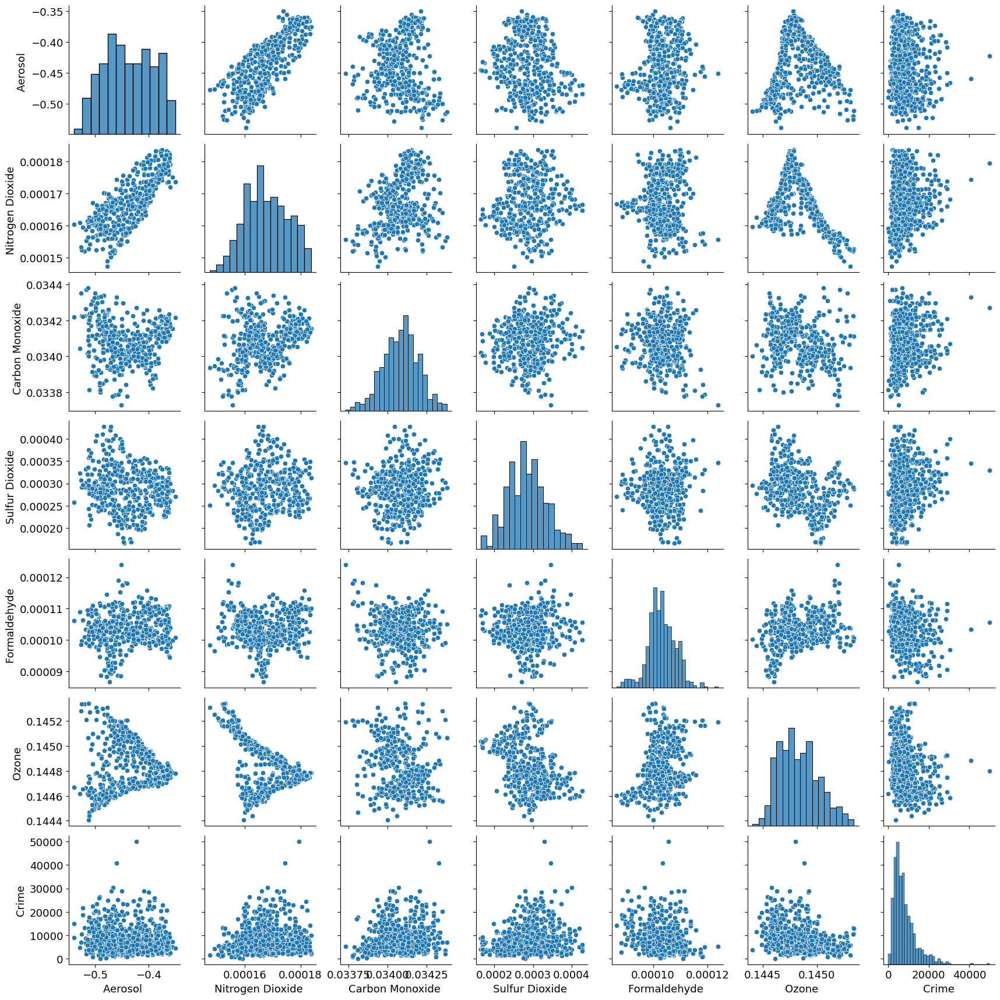

In [15]:
sns.pairplot(df_parameters[['Aerosol ', 'Nitrogen Dioxide ',
       'Carbon Monoxide ', 'Sulfur Dioxide ', 'Formaldehyde ', 'Ozone ', 'Crime']])
plt.savefig('EDA Air Pollution and Crime.png', dpi=300, bbox_inches='tight')
plt.show()

In [16]:
pearson_corr = df_parameters.corr(method='pearson')
kendall_corr = df_parameters.corr(method='kendall')

# corr = df_parameters
corr = pd.DataFrame()
corr['Pearson'] = pearson_corr['Crime'].round(2)
corr['Kendall'] = kendall_corr['Crime'].round(2)


In [17]:
corr = corr.iloc[:25,:]
corr.sort_values('Pearson', inplace=True, ascending=False)

In [18]:
cmap = sns.color_palette('coolwarm', as_cmap=True)

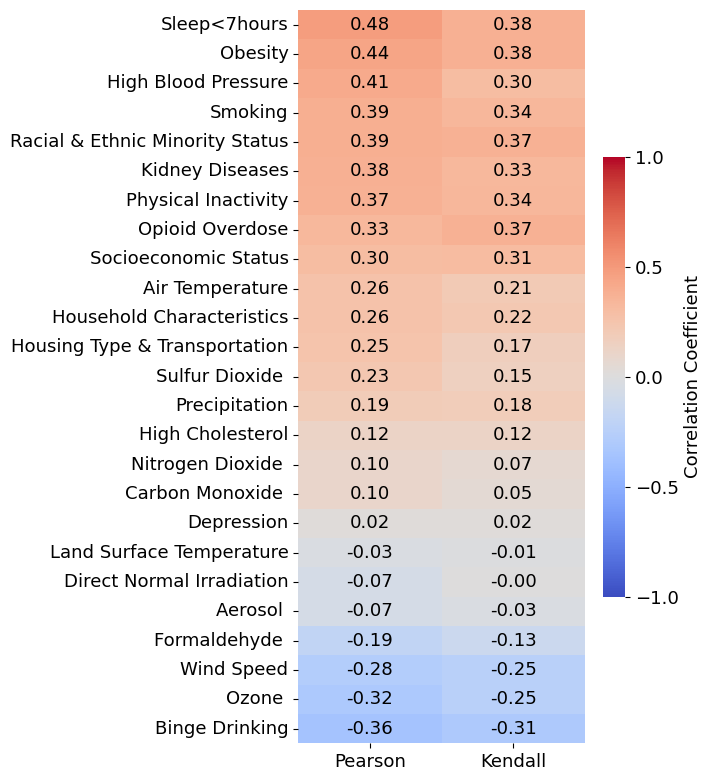

In [19]:
%matplotlib inline
plt.figure(figsize=(7, 8))
p = sns.heatmap(corr, 
                annot=True, 
                cmap=cmap,
                vmax=1,
                vmin=-1,
                fmt='.2f',
                annot_kws={'color':'black'},
                cbar_kws={'shrink': 0.6,
                          'label': 'Correlation Coefficient',
                          'ticks': [-1.0, -0.5, 0.0, 0.5, 1.0]
                         }
               )
# plt.title('Correlation Heatmap')
plt.tight_layout()
plt.savefig("1. Correlation.jpg", dpi=300)
plt.show()

In [203]:
# Normalizing the Diabetes with max value
# df_parameters['Crime'] = MinMaxScaler().fit_transform(df[['Crime']]) 

df_parameters['Crime'] = np.log(df['Crime'])
#Sorting the dataframe with the normalized diabetes values and sampling 350 datapoints
df_parameters.sort_values(by='Crime', inplace=True)
df_train = df_parameters.sample(400, random_state=1234)

<AxesSubplot:ylabel='Frequency'>

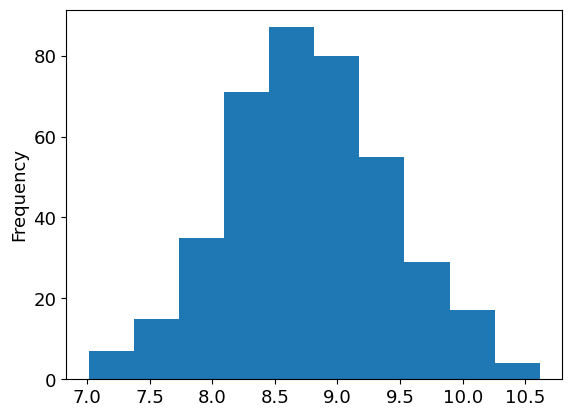

In [204]:
#Check the histogram/kde of normalized values
df_train['Crime'].plot(kind='hist')

In [245]:
#Splitting the data into independent and dependent variables
X_, y_ = df_train.iloc[:,:-1], df_train.iloc[:,-1]

#Training and validation set split
x_train, x_test, y_train, y_test = train_test_split(X_, y_, test_size=0.4, shuffle=True, random_state=14)

In [246]:
lr = LinearRegression()
lr.fit(x_train, y_train)
y_test_pred = lr.predict(x_test)
print("R2: ", np.round(r2_score(y_test, y_test_pred), 2))
print("MSE: ", np.round(mean_squared_error(y_test, y_test_pred), 2))
print("MAE:", np.round(mean_absolute_error(y_test, y_test_pred), 2))
print("MAPE:", np.round(mean_absolute_percentage_error(y_test, y_test_pred), 2))

R2:  0.28
MSE:  0.33
MAE: 0.44
MAPE: 0.05


In [247]:
rf = RandomForestRegressor()
rf.fit(x_train, y_train)
y_test_pred = rf.predict(x_test)
print("R2: ", np.round(r2_score(y_test, y_test_pred), 2))
print("MSE: ", np.round(mean_squared_error(y_test, y_test_pred), 2))
print("MAE:", np.round(mean_absolute_error(y_test, y_test_pred), 2))
print("MAPE:", np.round(mean_absolute_percentage_error(y_test, y_test_pred), 2))

R2:  0.46
MSE:  0.24
MAE: 0.39
MAPE: 0.04


In [248]:
catboost = CatBoostRegressor(verbose=False)
catboost.fit(x_train, y_train)
y_test_pred = catboost.predict(x_test)
print("R2: ", np.round(r2_score(y_test, y_test_pred), 2))
print("MSE: ", np.round(mean_squared_error(y_test, y_test_pred), 2))
print("MAE:", np.round(mean_absolute_error(y_test, y_test_pred), 2))
print("MAPE:", np.round(mean_absolute_percentage_error(y_test, y_test_pred), 2))

R2:  0.49
MSE:  0.23
MAE: 0.37
MAPE: 0.04


In [308]:
param_distributions = {
#     'iterations': [1200],
# #     'depth': [3, 4, 5],
# #     'min_data_in_leaf':[9, 11, 13],
#     'learning_rate': [0.005],
#     'l2_leaf_reg': [5, 7],
# #     'colsample_bylevel': [0.3, 0.4],
#     'bagging_temperature': [1.5],
# #     'random_strength': [1],
#     'loss_function': ['MAE'],
#     'od_type': ["IncToDec", "Iter"],
#     'od_wait':[30, 40 ,50]
}

catboost = CatBoostRegressor(verbose=False)
# Randomized grid search
random_search = RandomizedSearchCV(catboost, param_distributions, n_iter=10, cv=5, n_jobs=-1, random_state=42)
random_search.fit(x_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x15420bb20>,
                   n_jobs=-1, param_distributions={}, random_state=42)

In [309]:
model = random_search.best_estimator_
model.fit(x_train, y_train, eval_set=(x_test, y_test), )

In [310]:
print(random_search.best_params_)
# print(model.get_all_params())

{}


In [311]:
r2_score(y_train, model.predict(x_train))

0.991444231706701

In [312]:
y_test_pred = model.predict(x_test)
r2_score(y_test, y_test_pred)

0.5080442042061951

In [313]:
y_train.describe()

count    240.000000
mean       8.734819
std        0.642606
min        7.013915
25%        8.301956
50%        8.737763
75%        9.158310
max       10.164736
Name: Crime, dtype: float64

In [314]:
y_test.describe()

count    160.000000
mean       8.819057
std        0.675947
min        7.083388
25%        8.377850
50%        8.771012
75%        9.266697
max       10.615653
Name: Crime, dtype: float64

In [315]:
d = df.copy(deep=True)

In [316]:
d = d.drop(columns=['TRACTCE10', 'GEOID10', 'NAMELSAD10', 'Long', 'Lat', 'State', 'County','EP_AFAM', 'EP_HISP',
       'EP_ASIAN', 'EP_AIAN', 'SVI'], axis=1)

In [317]:
d['Crime'] = np.log(d['Crime'])

In [318]:
d['Crime_pred'] = model.predict(d.iloc[:,1:-1])

In [319]:
regression_roc_auc_score(approxes=d['Crime_pred'], targets=d['Crime'])

0.8037270928549304

In [320]:
r2_score(y_pred=d['Crime_pred'], y_true=d['Crime'])

0.5552858577802868

In [321]:
d['Crime_pred'].describe()

count    796.000000
mean       8.775618
std        0.517338
min        7.071562
25%        8.406333
50%        8.740296
75%        9.172186
max       10.054489
Name: Crime_pred, dtype: float64

In [322]:
d['Crime'].describe()

count    796.000000
mean       8.771046
std        0.700744
min        3.988984
25%        8.328391
50%        8.801545
75%        9.251314
max       10.819778
Name: Crime, dtype: float64

<AxesSubplot:ylabel='Density'>

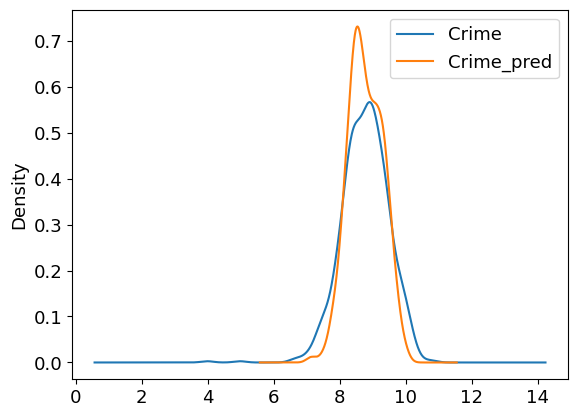

In [323]:
d[['Crime','Crime_pred']].plot(kind='kde')

In [324]:
X_, y, y_hat = d.iloc[:,:-2], d.iloc[:,-2], d.iloc[:,-1]
X = X_.iloc[:, 1:]
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

shap.force_plot(explainer.expected_value, shap_values, X)

In [325]:
exclude = df_train.index.to_list()

mask = ~y.index.isin(exclude)
Y_test = y[mask]
Y_hat = y_hat[mask]


In [326]:
#MSE
mean_squared_error(y_true=Y_test,
                   y_pred=Y_hat
                  )

0.3460174810470468

In [327]:
#MAE
mean_absolute_error(y_true=Y_test,
                    y_pred=Y_hat
                   )

0.40931771400629324

In [328]:
#MAPE
mean_absolute_percentage_error(y_true=Y_test,
                               y_pred=Y_hat
                              )

0.050048070736923106

In [329]:
#R2 Score
r2_score(y_true=Y_test, y_pred=Y_hat)

0.37246482077887744

In [330]:
d.reset_index(drop=True, inplace=True)

In [331]:
shap_df = pd.DataFrame(shap_values, columns=X.columns)

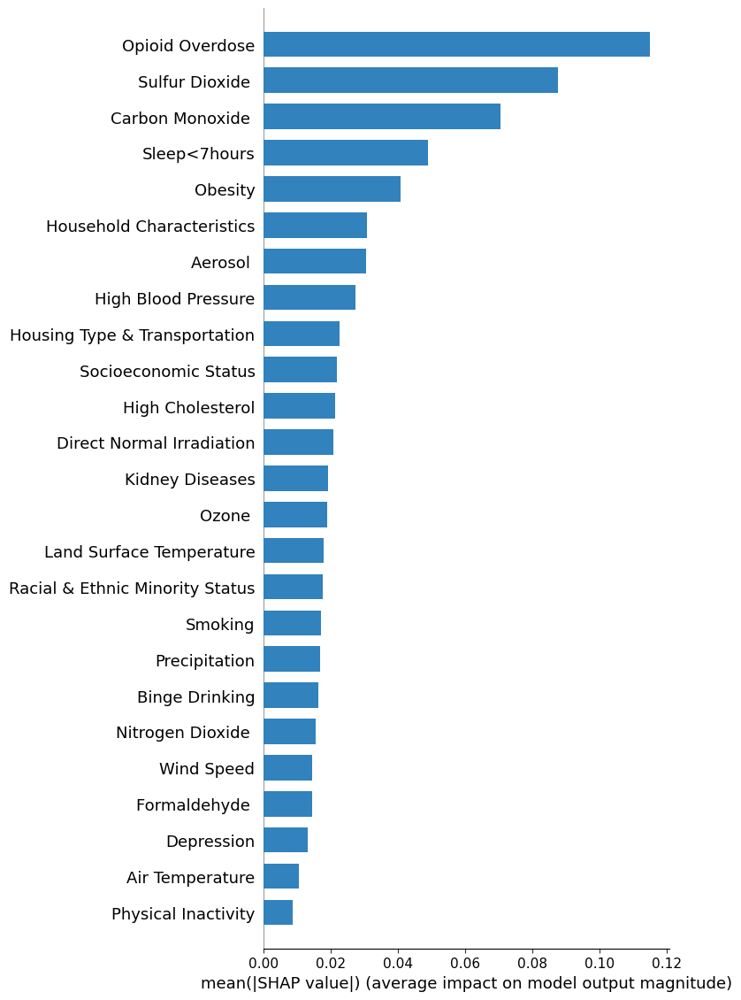

In [332]:
shap.summary_plot(shap_values, 
                  X, 
                  plot_type='bar',
                  color_bar=True,
                  color="#3182bd",
                  show=False,
                  max_display=25
                 )
# plt.title("Parameter contribution for High Diabetes")
plt.tight_layout()
plt.xticks(color='black')
plt.yticks(color='black')
plt.savefig(f'2. Mean_shap_values.jpg', dpi=300, bbox_inches='tight')
plt.show()

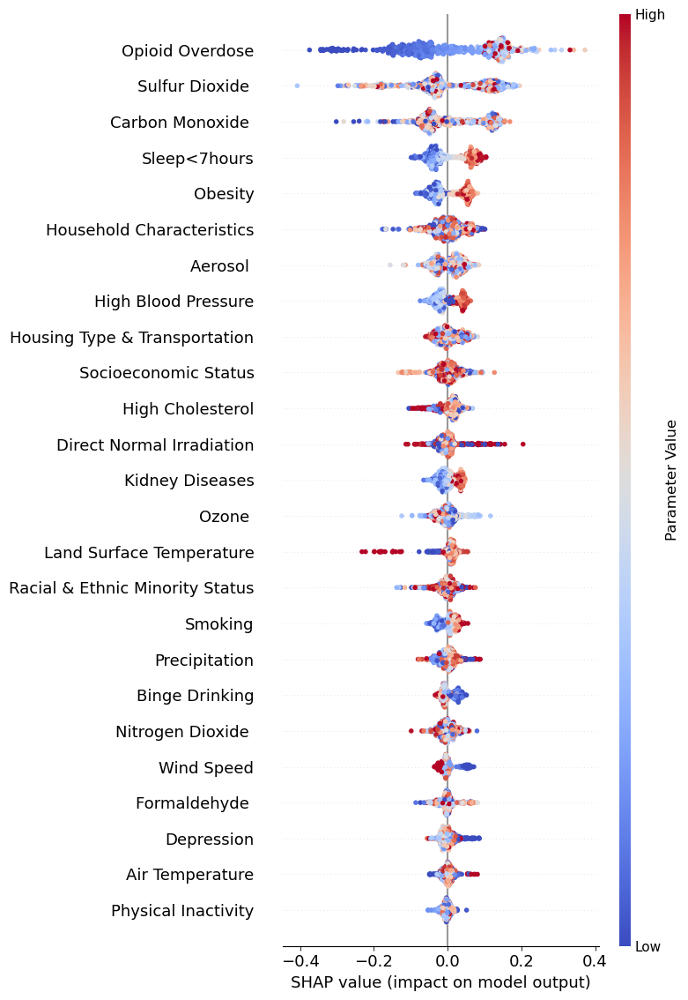

In [333]:
shap.summary_plot(shap_values, X, cmap=cmap, show=False, max_display=25, color_bar_label='Parameter Value')
plt.tight_layout()
plt.xticks(fontsize=13, color='black')
plt.yticks(fontsize=13, color='black')
plt.savefig(f'3. Mean_shap_values_beeplot.jpg', dpi=300, bbox_inches='tight')
plt.show()

In [334]:
df_plot = X_.join(shap_df, rsuffix='_shap').set_index('NAME10')
df_plot

,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,Kidney Diseases,...,Aerosol _shap,Nitrogen Dioxide _shap,Carbon Monoxide _shap,Sulfur Dioxide _shap,Formaldehyde _shap,Ozone _shap,Socioeconomic Status_shap,Household Characteristics_shap,Racial & Ethnic Minority Status_shap,Housing Type & Transportation_shap
NAME10,,,,,,,,,,,,,,,,,,,,,
101.00,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,2.7,...,0.035219,-0.019335,-0.065309,0.079665,0.014602,-0.023847,-0.001561,0.023394,0.008199,-0.042502
102.01,20.5,13.9,11.2,38.7,20.155039,26.2,36.3,31.1,16.3,2.8,...,0.041035,0.039957,-0.027923,0.131747,0.037705,-0.006153,0.010815,0.029872,0.019426,-0.018340
102.02,19.1,13.4,11.5,37.3,53.229241,29.6,35.1,34.6,15.7,3.3,...,0.004776,-0.005426,-0.053978,0.096381,0.028203,-0.020394,0.011751,0.024745,0.005118,-0.036911
103.00,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,2.8,...,0.026530,-0.024788,-0.052960,0.072518,-0.003576,-0.035043,-0.005256,0.011469,-0.001141,-0.037339
104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,1.8,...,-0.013375,-0.032929,-0.068274,0.063755,-0.020837,-0.050162,-0.109824,-0.014153,0.000821,-0.048903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8435.00,30.4,16.5,12.7,44.9,15.032275,22.3,41.0,34.0,14.7,2.7,...,0.021830,0.010799,-0.010009,0.140853,-0.035295,-0.004590,-0.014486,0.011190,-0.004858,-0.000840
8436.00,15.7,11.0,9.7,41.5,42.750267,26.7,38.1,38.4,13.9,3.2,...,0.042177,0.002031,0.070741,-0.043980,-0.010752,0.005756,0.002766,-0.068867,0.007690,-0.011520
8437.00,11.8,17.7,6.4,30.3,18.894662,24.7,25.4,21.5,15.6,1.9,...,-0.042059,-0.008820,-0.056039,-0.042077,-0.004491,0.008849,0.009607,-0.002449,-0.006421,-0.027567


In [335]:
df_plot['proba'] = np.round(model.predict(X), decimals=2)

In [336]:
df_plot.head()

,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,Kidney Diseases,...,Nitrogen Dioxide _shap,Carbon Monoxide _shap,Sulfur Dioxide _shap,Formaldehyde _shap,Ozone _shap,Socioeconomic Status_shap,Household Characteristics_shap,Racial & Ethnic Minority Status_shap,Housing Type & Transportation_shap,proba
NAME10,,,,,,,,,,,,,,,,,,,,,
101.00,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,2.7,...,-0.019335,-0.065309,0.079665,0.014602,-0.023847,-0.001561,0.023394,0.008199,-0.042502,8.91
102.01,20.5,13.9,11.2,38.7,20.155039,26.2,36.3,31.1,16.3,2.8,...,0.039957,-0.027923,0.131747,0.037705,-0.006153,0.010815,0.029872,0.019426,-0.018340,9.21
102.02,19.1,13.4,11.5,37.3,53.229241,29.6,35.1,34.6,15.7,3.3,...,-0.005426,-0.053978,0.096381,0.028203,-0.020394,0.011751,0.024745,0.005118,-0.036911,8.93
103.00,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,2.8,...,-0.024788,-0.052960,0.072518,-0.003576,-0.035043,-0.005256,0.011469,-0.001141,-0.037339,8.48
104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,1.8,...,-0.032929,-0.068274,0.063755,-0.020837,-0.050162,-0.109824,-0.014153,0.000821,-0.048903,8.06


In [337]:
df_plot['proba'].describe()

count    796.00000
mean       8.77549
std        0.51723
min        7.07000
25%        8.40750
50%        8.74000
75%        9.17000
max       10.05000
Name: proba, dtype: float64

In [338]:
df_plot['proba'] = MinMaxScaler().fit_transform(df_plot[['proba']])

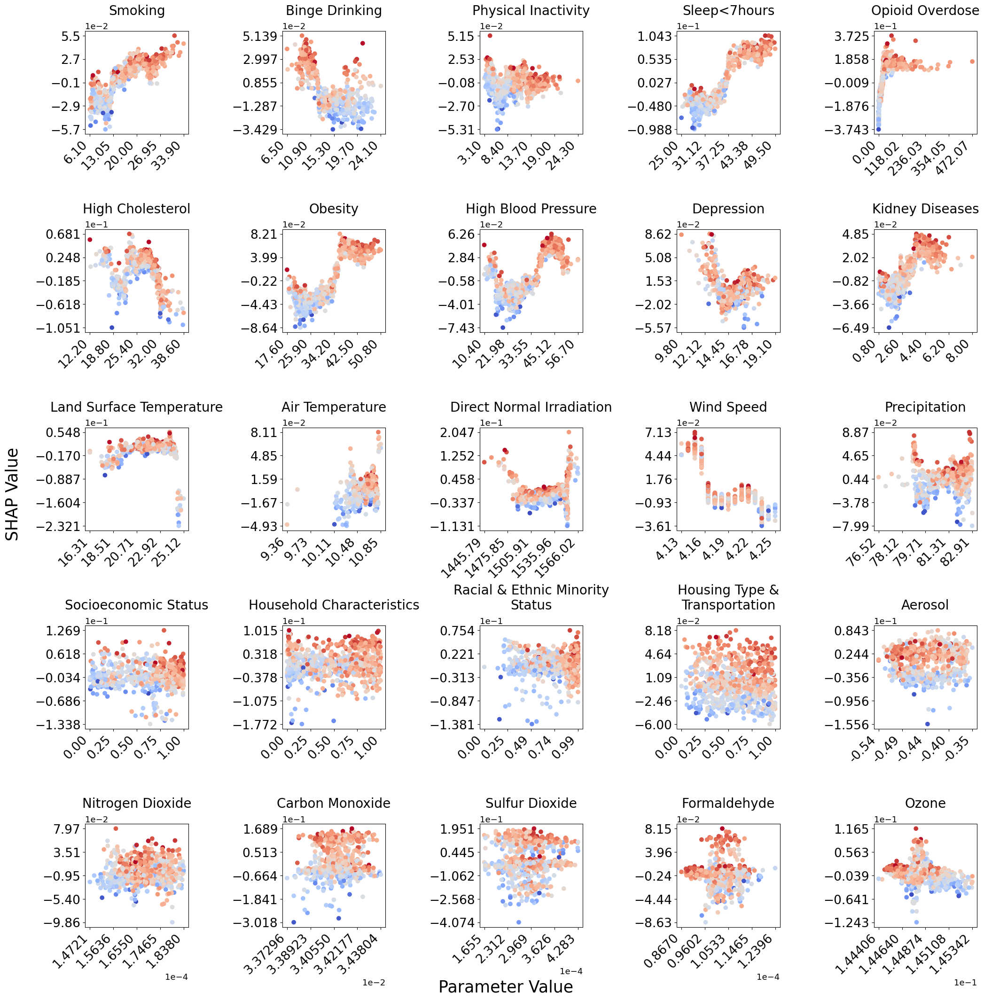

In [339]:
from matplotlib.ticker import FormatStrFormatter

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(21, 21))
ax = axs.ravel()
columns = x_train.columns

sci_notation_variables = ['Nitrogen Dioxide ', 'Carbon Monoxide ', 'Sulfur Dioxide ',
                          'Formaldehyde ', 'Ozone ']

for i, col in enumerate(columns):
    
    wrapped_title = "\n".join(textwrap.wrap(f"{col}", width=25))
    ax[i].set_title(wrapped_title, fontdict={'fontsize':20}, y=1.12)
#     ax2.title.set_position([.5, 1.05])

    p = ax[i].scatter(data=df_plot, x=col, y=f"{col}_shap", c="proba", cmap=cmap)
    
    ax[i].set(xlabel=None, ylabel=None, label=None)
    ax[i].set_xticks(np.linspace(np.min(df_plot[col]), np.max(df_plot[col]), 5))
    plt.setp(ax[i].get_xticklabels(), rotation=45, horizontalalignment='right')
    ax[i].tick_params(axis='x', labelsize=19)
    
    if col in sci_notation_variables:
        ax[i].ticklabel_format(style='scientific', axis='x', scilimits=(0,0))
        
    else:
        ax[i].xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    
    ax[i].tick_params(axis='y', labelsize=19)
    ax[i].set_yticks(np.linspace(np.min(df_plot[f"{col}_shap"]), np.max(df_plot[f"{col}_shap"]), 5))
    ax[i].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    
    ax[i].set_box_aspect(1)
    
    
    
    
# fig.suptitle("SHAP Values for Parameters", fontsize=30)
fig.text(0.5, 0.0, 'Parameter Value', ha='center', va='center', fontsize=25)
fig.text(0.0, 0.5, 'SHAP Value', ha='center', va='center', rotation='vertical', fontsize=25)


# cax = fig.add_axes([1, 0.1, 0.02, 0.8])
# cb = ColorbarBase(cax, cmap=cmap, orientation='vertical', ticks=np.linspace(0, 1, 5))
# cb.ax.tick_params(labelsize=18)

# cbar = fig.colorbar(p, ax=axs, cmap=cmap, shrink=0.6, anchor=(2.4,0.5))
# cbar = fig.colorbar(p, ax=axs, cmap=cmap, shrink=0.4, anchor=(2.4,0.5))
# cbar.set_label('Crime Vulnerability', fontsize=25, loc='center', labelpad=15)
# cbar.ticks = ticks=np.linspace(0, 1, 5) 
# cbar.ax.tick_params(labelsize=18)
fig.tight_layout(pad=0.06)
# plt.axis('square')
plt.xticks(color='black')
plt.yticks(color='black')
plt.savefig(f'4. SHAP values for individual Parameters.jpg', dpi=300, bbox_inches='tight')
plt.show()

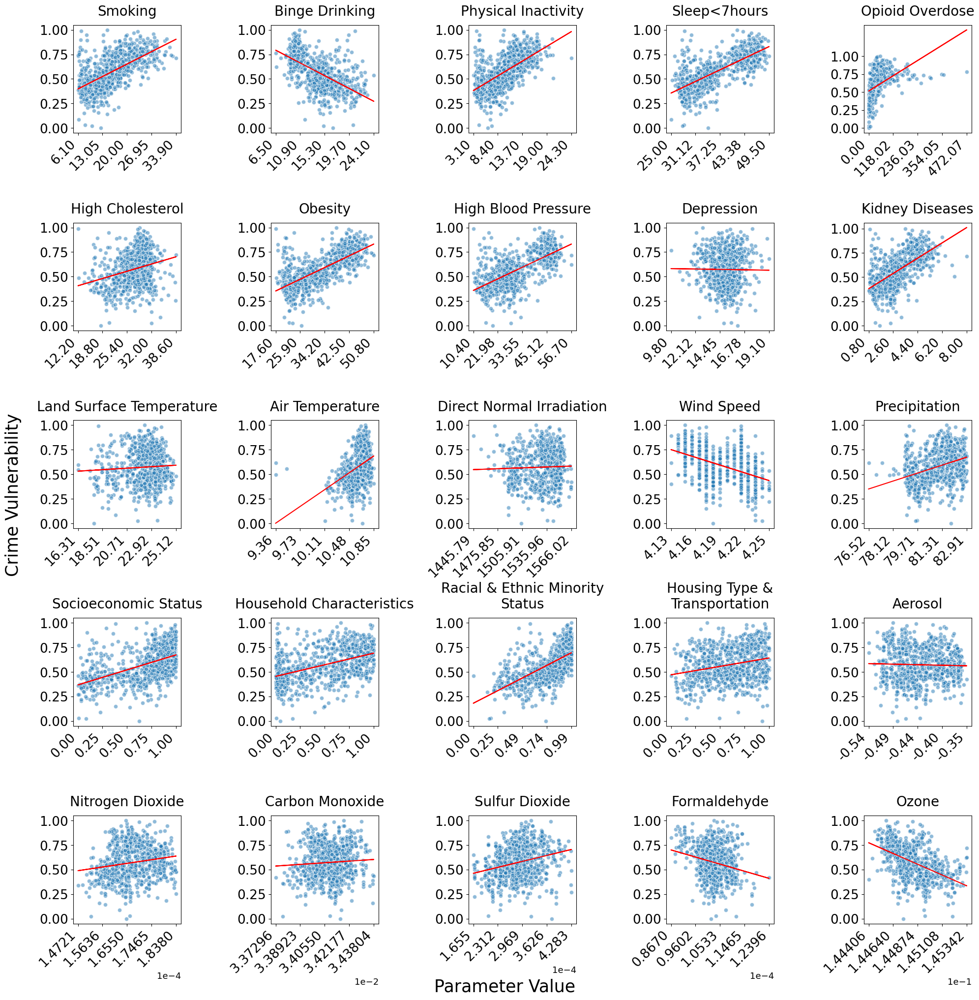

In [340]:
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20, 20))
ax = axs.ravel()
columns = x_train.columns

for i, col in enumerate(columns):
    
    wrapped_title = "\n".join(textwrap.wrap(f"{col}", width=25))
    ax[i].set_title(wrapped_title, fontdict={'fontsize':20}, y=1.05)
    
    ax[i].set(xlabel=None, ylabel=None, label=None)
    ax[i].set_xticks(np.linspace(np.min(df_plot[col]), np.max(df_plot[col]), 5))
    ax[i].tick_params(axis='x', labelsize=19)
    plt.setp(ax[i].get_xticklabels(), rotation=45, horizontalalignment='right')
    
    if col in sci_notation_variables:
        ax[i].ticklabel_format(style='scientific', axis='x', scilimits=(0,0))
        
    else:
        ax[i].xaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[i].set_yticks(np.linspace(0, 1, 5))
    ax[i].tick_params(axis='y', labelsize=19)
    ax[i].yaxis.set_major_formatter(mpl.ticker.FormatStrFormatter('%.2f'))
    
    ax[i].set_box_aspect(1)
    
    x, y = df_plot[col], df_plot['proba']
    m, b = np.polyfit(x, y, 1)
    
#     p = ax[i].scatter(data=df_plot, x=col, y="proba", c="proba", cmap=cmap)
    ax[i].scatter(data=df_plot, x=col, y="proba", alpha=0.5, edgecolors='white')
    ax[i].plot(x, m*x + b, color='red', )
    
    
# fig.suptitle("Diabetes Vulnerability v/s Parameters", fontsize=30, y=1.01)
fig.text(0.5, 0.0, 'Parameter Value', ha='center', va='center', fontsize=25)
fig.text(0.0, 0.5, 'Crime Vulnerability', ha='center', va='center', rotation='vertical', fontsize=25)

# cbar = fig.colorbar(p, ax=axs, cmap=cmap, shrink=0.6, anchor=(2.4,0.5) )
# cbar.set_label('Predicted Proba', fontsize=25)
# cbar.ax.tick_params(labelsize=18)
# cbar.ticks = ticks=np.linspace(0,1, 5) 
fig.tight_layout(pad=0.06)
plt.savefig(f'5. Vulnerability values vs Parameters.jpg', dpi=300, bbox_inches='tight')
plt.show()

In [341]:
vul_breaks = jenkspy.jenks_breaks(d['Crime_pred'], 5)

d['Vulnerability_Class'] = pd.cut(d['Crime_pred'], 
                                  bins=vul_breaks,
                                  labels=['Very Low', 'Low', 'Moderate', 'High', 'Very High'],
                                  include_lowest=True)

d['Vulnerability_ClassNum'] = pd.cut(d['Crime_pred'], 
                                     bins=vul_breaks,
                                     labels=range(1, len(vul_breaks)),
                                     include_lowest=True)

prev_breaks = jenkspy.jenks_breaks(d['Crime'], 5)

d['Crime_Class'] = pd.cut(d['Crime'],
                             bins=prev_breaks,
                             labels=['Very Low', 'Low', 'Moderate', 'High', 'Very High'],
                             include_lowest=True)

d['Crime_ClassNum'] = pd.cut(d['Crime'],
                                bins=prev_breaks,
                                labels=range(1, len(prev_breaks)),
                                include_lowest=True)

In [342]:
d[d['Vulnerability_Class'].isin(['High', 'Very High', 'Moderate'])]['Crime_Class'].value_counts()

High         247
Very High    132
Moderate     100
Low           14
Very Low       2
Name: Crime_Class, dtype: int64

In [343]:
def annotate_fig (fig):
  for p in fig.patches:
      fig.annotate('{:.0f}'.format(p.get_height()), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', 
                    xytext = (0, 9), 
                    textcoords = 'offset points')

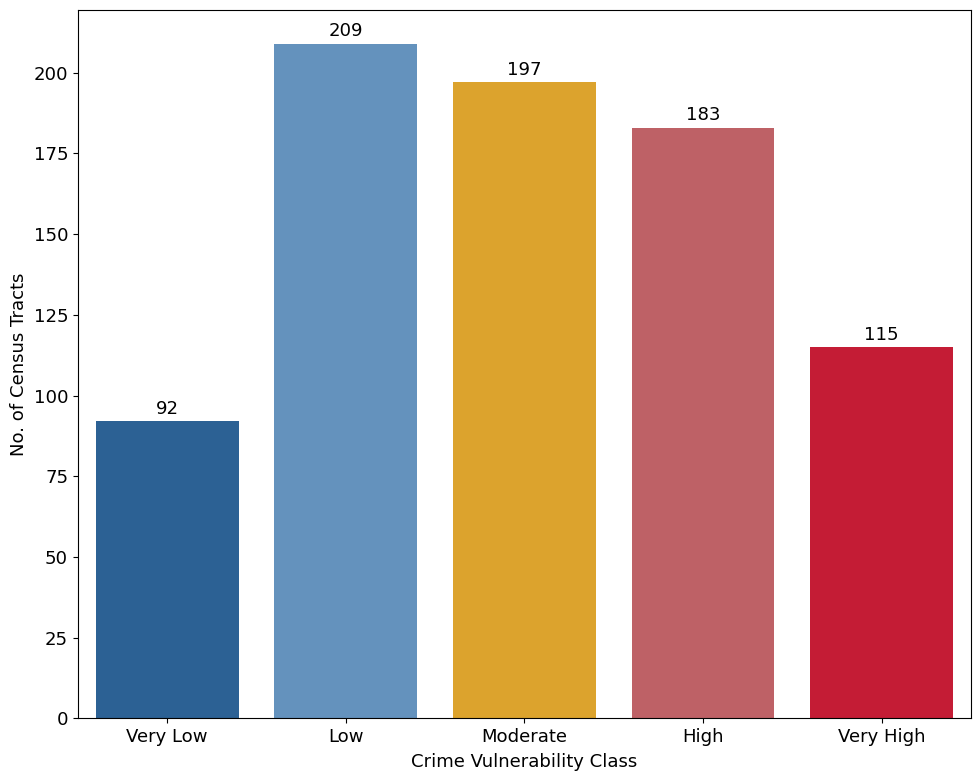

In [344]:
plt.figure(figsize=(10,8))
vulnerability_val_counts = d['Vulnerability_Class'].value_counts(sort=False)

colors = sns.color_palette(['#1b62a5', '#5592cc', '#f9ad10', '#cd5258', '#e00021'])

plot = sns.barplot(x=vulnerability_val_counts.index, y=vulnerability_val_counts.values, palette=colors)
annotate_fig(plot)
plt.xticks(rotation=0)
plt.xlabel('Crime Vulnerability Class', labelpad=5)
plt.ylabel('No. of Census Tracts')
plt.tight_layout()
plt.savefig(f'Diabetes Vulnerability Classes barplot.jpg', dpi=300)
plt.show()

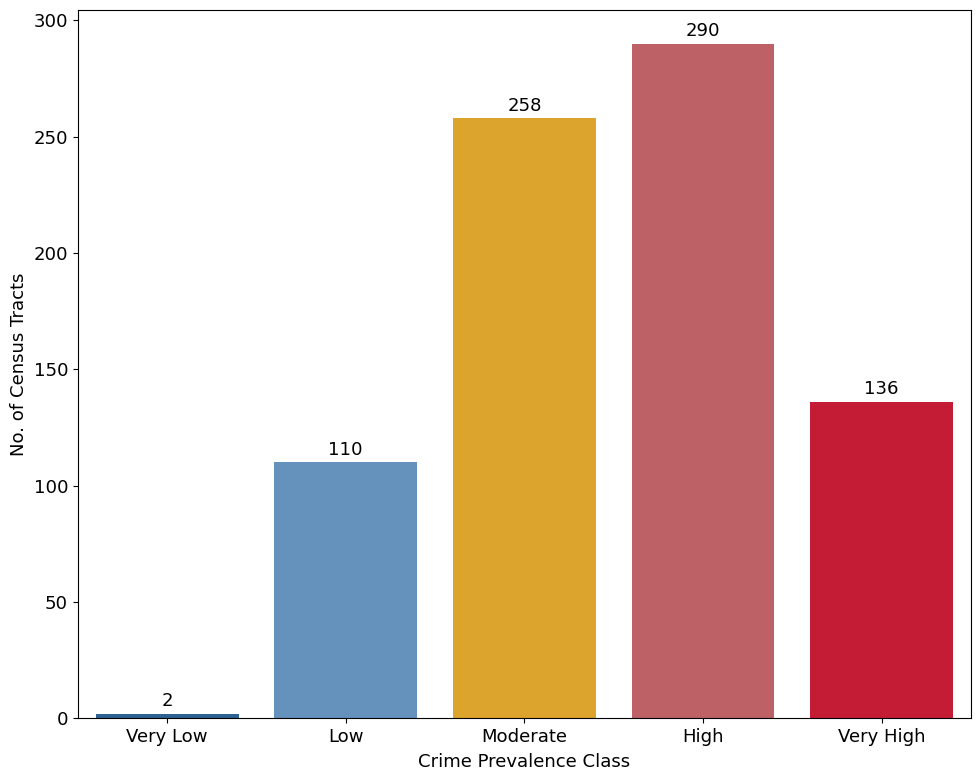

In [345]:
plt.figure(figsize=(10,8))

prevelence_val_counts= d['Crime_Class'].value_counts(sort=False)

colors = sns.color_palette(['#1b62a5', '#5592cc', '#f9ad10', '#cd5258', '#e00021'])

plot = sns.barplot(x=prevelence_val_counts.index, y=prevelence_val_counts.values, palette=colors)
annotate_fig(plot)
plt.xticks(rotation=0)
plt.xlabel('Crime Prevalence Class', labelpad=5)
plt.ylabel('No. of Census Tracts')
plt.tight_layout()
plt.savefig('Crime Prevalence Classes barplot.jpg', dpi=300)
plt.show()

In [346]:
import pickle
model.save_model(f'Regressor_model')

with open(f'SHAP_explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

In [347]:
d

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Crime,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum,Crime_Class,Crime_ClassNum
0,101.00,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,...,0.7721,0.5522,0.7028,0.9275,9.482807,8.910367,Moderate,3,Very High,5
1,102.01,20.5,13.9,11.2,38.7,20.155039,26.2,36.3,31.1,16.3,...,0.7859,0.7549,0.7832,0.9966,9.285170,9.214053,High,4,High,4
2,102.02,19.1,13.4,11.5,37.3,53.229241,29.6,35.1,34.6,15.7,...,0.9211,0.6130,0.7866,0.9991,9.459541,8.930568,Moderate,3,Very High,5
3,103.00,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,...,0.7681,0.2998,0.6767,0.9757,9.252537,8.478275,Low,2,High,4
4,104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.6916,0.1262,0.5161,0.9721,8.861067,8.060625,Very Low,1,High,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791,8435.00,30.4,16.5,12.7,44.9,15.032275,22.3,41.0,34.0,14.7,...,0.9883,0.0713,0.8649,0.8741,8.848796,8.878160,Moderate,3,High,4
792,8436.00,15.7,11.0,9.7,41.5,42.750267,26.7,38.1,38.4,13.9,...,0.8157,0.6563,0.9189,0.6004,9.168893,9.090151,High,4,High,4
793,8437.00,11.8,17.7,6.4,30.3,18.894662,24.7,25.4,21.5,15.6,...,0.3019,0.2730,0.5499,0.4423,8.672657,8.451743,Low,2,Moderate,3
794,8438.00,20.6,12.3,12.1,40.4,42.654028,28.7,37.3,36.9,15.7,...,0.8750,0.8369,0.8133,0.0983,9.108529,9.054506,High,4,High,4


In [349]:
d.to_csv('AllParameters and Vulnerability Classes.csv')
pd.read_csv('AllParameters and Vulnerability Classes.csv', index_col=0)

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Crime,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum,Crime_Class,Crime_ClassNum
0,101.00,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,...,0.7721,0.5522,0.7028,0.9275,9.482807,8.910367,Moderate,3,Very High,5
1,102.01,20.5,13.9,11.2,38.7,20.155039,26.2,36.3,31.1,16.3,...,0.7859,0.7549,0.7832,0.9966,9.285170,9.214053,High,4,High,4
2,102.02,19.1,13.4,11.5,37.3,53.229241,29.6,35.1,34.6,15.7,...,0.9211,0.6130,0.7866,0.9991,9.459541,8.930568,Moderate,3,Very High,5
3,103.00,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,...,0.7681,0.2998,0.6767,0.9757,9.252537,8.478275,Low,2,High,4
4,104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.6916,0.1262,0.5161,0.9721,8.861067,8.060625,Very Low,1,High,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791,8435.00,30.4,16.5,12.7,44.9,15.032275,22.3,41.0,34.0,14.7,...,0.9883,0.0713,0.8649,0.8741,8.848796,8.878160,Moderate,3,High,4
792,8436.00,15.7,11.0,9.7,41.5,42.750267,26.7,38.1,38.4,13.9,...,0.8157,0.6563,0.9189,0.6004,9.168893,9.090151,High,4,High,4
793,8437.00,11.8,17.7,6.4,30.3,18.894662,24.7,25.4,21.5,15.6,...,0.3019,0.2730,0.5499,0.4423,8.672657,8.451743,Low,2,Moderate,3
794,8438.00,20.6,12.3,12.1,40.4,42.654028,28.7,37.3,36.9,15.7,...,0.8750,0.8369,0.8133,0.0983,9.108529,9.054506,High,4,High,4


In [352]:
df_cvi = d[['NAME10', 'Crime_pred', 'Vulnerability_Class', 'Vulnerability_ClassNum']]
df_svi = df_svi.merge(df_cvi, left_on='NAME10', right_on='NAME10')

In [355]:
df_minorities = df_minorities.merge(df_cvi, left_on='NAME10', right_on='NAME10')

In [356]:
def getClassforCols(df_, cols):
    df = df_.copy(deep=True)
    n_breaks=5
    breaks = np.linspace(0, 100, n_breaks+1)
    for col in cols:
#         df[col] = MinMaxScaler().fit_transform(df[[col]])
        if col != 'EP_AIAN1':
            df[f'{col}_Class'] = pd.cut(df[col],
                                        bins=breaks,
                                        labels=['Very Low', 'Low', 'Moderate', 'High', 'Very High'],
                                        include_lowest=True,
                                        duplicates='drop'
                                       )

            df[f'{col}_ClassNum'] = pd.cut(df[col],
                                           bins=breaks,
                                           labels=range(1, n_breaks+1),
                                           include_lowest=True,
                                           duplicates='drop'
                                          )

        else:
            breaks = (-1, 0, 100)
            df[f'{col}_Class'] = pd.cut(df[col],
                                        bins=breaks,
                                        labels=['Not Present', 'Present'],
                                        include_lowest=True,
                                        duplicates='drop'
                                       )

            df[f'{col}_ClassNum'] = pd.cut(df[col],
                                           bins=breaks,
                                           labels=[0, 1],
                                           include_lowest=True,
                                           duplicates='drop'
                                          )
        
    return df

In [358]:
cols_to_break = ['EP_AFAM', 'EP_HISP', 'EP_ASIAN', 'EP_AIAN']
# cols_to_break = ['E_AFAM', 'E_HISP', 'E_ASIAN', 'E_AIAN']

df_minorities_Class = getClassforCols(df_minorities, cols_to_break)

In [361]:
col_broken = [f"{col}_Class" for col in cols_to_break]

dfs = []
for i in range(len(col_broken)):
    a = df_minorities_Class.groupby(by=['Vulnerability_Class', col_broken[i]])[cols_to_break[i]].count()
    dfs.append(a)

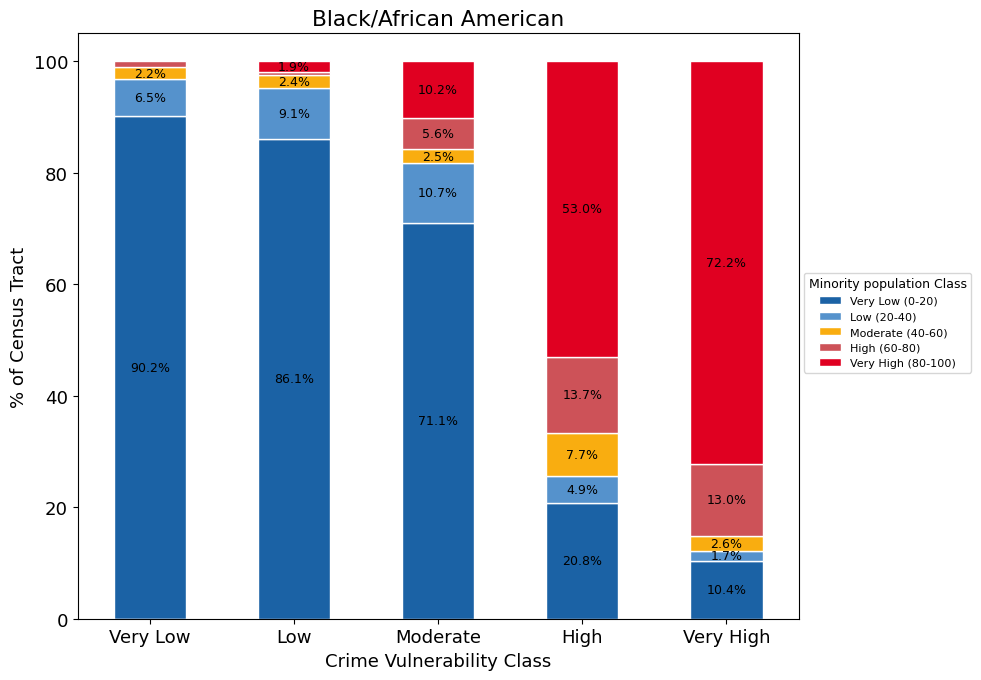

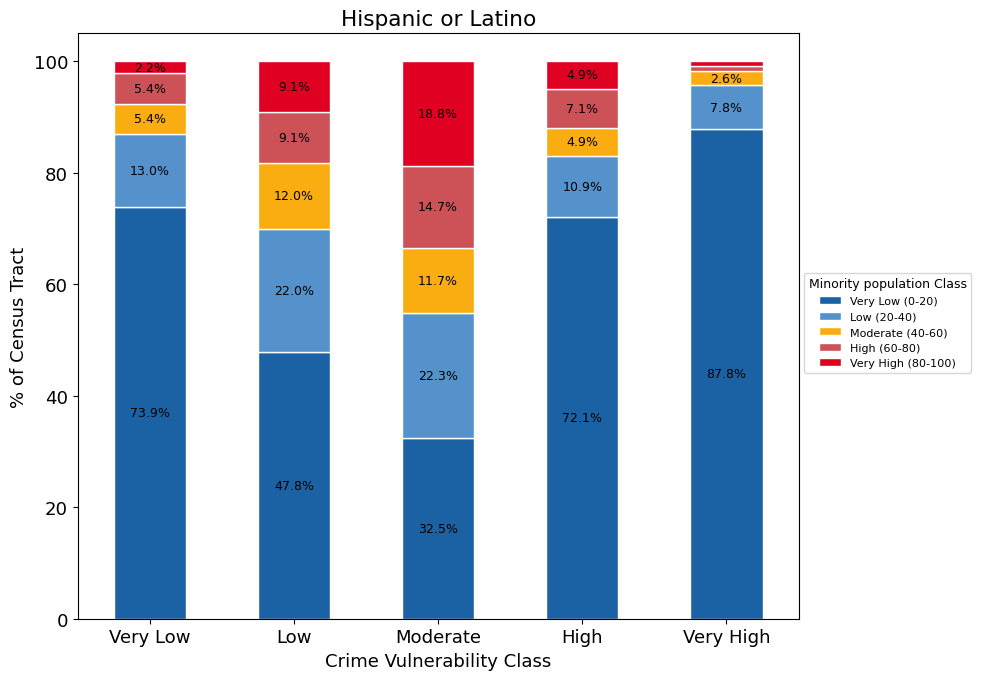

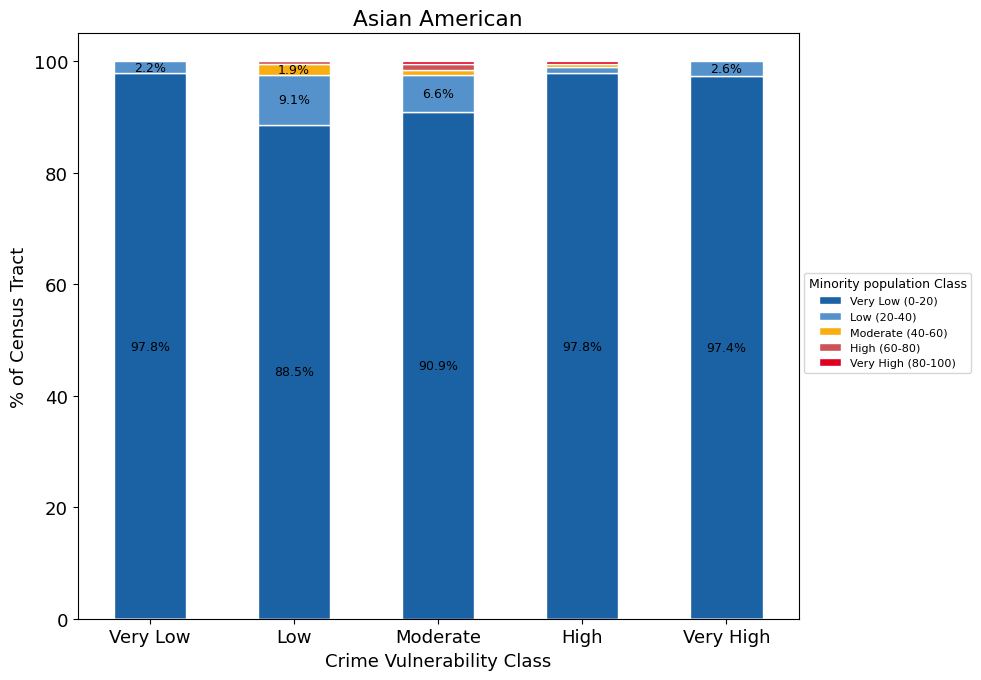

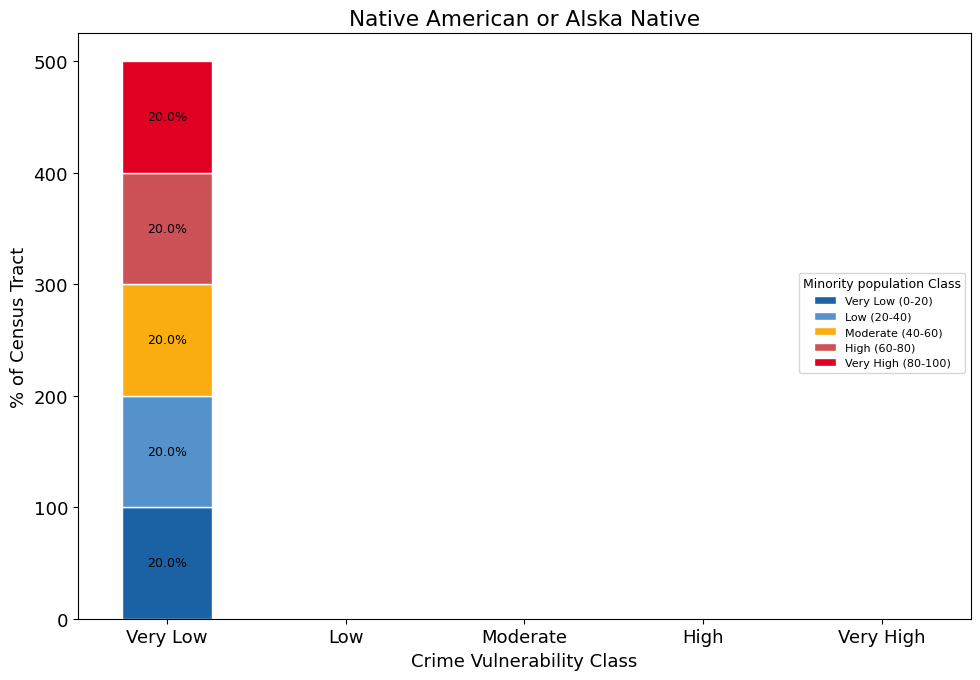

In [366]:
colors = ['#1b62a5', '#5592cc', '#f9ad10', '#cd5258', '#e00021']
titles = ['Black/African American', 'Hispanic or Latino', 'Asian American', 'Native American or Alska Native']
legend_labels = ["Very Low (0-20)", "Low (20-40)", "Moderate (40-60)", "High (60-80)", "Very High (80-100)"]
for i, col in enumerate(col_broken):
    fig, ax = plt.subplots(figsize=(11, 9))
    if col == 'EP_AIAN_Class':
        unstacked = dfs[i].unstack(level=0)
        stacked_percent = (unstacked / unstacked.sum()) * 100
        
    else:
        unstacked = dfs[i].unstack()
        unstacked.index = pd.Categorical(unstacked.index, ordered=True, categories=['Very Low', 'Low', 'Moderate', 'High', 'Very High'])
        unstacked = unstacked.sort_index()
        stacked_percent = unstacked.div(unstacked.sum(axis=1), axis=0) * 100
    
    stacked_percent.plot(kind='bar', stacked=True, fontsize=13, rot=0, color=colors, ax=ax, edgecolor='white')
    for j, (name, values) in enumerate(stacked_percent.iterrows()):
        total = values.sum()
        for k, value in enumerate(values):
            if value > 1.5:
                percent = value / total * 100
                ax.text(j, sum(values[:k+1]) - value/2, f'{percent:.1f}%', ha='center', va='center', fontdict={'fontsize':9}, color='black')
    ax.legend(title=f"Minority population Class", labels=legend_labels, fontsize=8, title_fontsize=9, bbox_to_anchor=(1., 0.6))
    fig.set_size_inches(10,7, forward=False)
    plt.title(titles[i])
    plt.xlabel('Crime Vulnerability Class')
    plt.ylabel('% of Census Tract')
    plt.tight_layout()
    fig.savefig(f'{col}.jpg', bbox_inches='tight',dpi=300)
    plt.show()

## Exporting the classes of vulnerability

In [322]:
d = d.sort_values("NAME10").reset_index(drop=True)

In [323]:
d.to_csv('AllParameters and Vulnerability Classes.csv')
pd.read_csv('AllParameters and Vulnerability Classes.csv', index_col=0)

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone,Crime,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum,Crime_Class,Crime_ClassNum
0,101.0,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,...,0.034224,0.000291,0.000101,0.145337,9.482807,8.868643,Moderate,3,High,4
1,103.0,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,...,0.034224,0.000291,0.000100,0.145337,9.252537,8.719494,Moderate,3,High,4
2,104.0,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.034353,0.000307,0.000099,0.145281,8.861067,8.872550,Moderate,3,Moderate,3
3,106.0,14.8,15.9,8.2,34.5,18.041660,24.9,30.5,26.3,16.0,...,0.034221,0.000282,0.000099,0.145273,9.299358,9.025564,High,4,High,4
4,201.0,15.2,13.2,8.9,35.4,7.566204,28.1,29.5,29.5,14.3,...,0.034115,0.000299,0.000104,0.145310,8.631236,8.631126,Moderate,3,Moderate,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
658,8435.0,30.4,16.5,12.7,44.9,15.032275,22.3,41.0,34.0,14.7,...,0.034137,0.000283,0.000099,0.144767,8.848796,8.817891,Moderate,3,Moderate,3
659,8436.0,15.7,11.0,9.7,41.5,42.750267,26.7,38.1,38.4,13.9,...,0.034080,0.000374,0.000106,0.144690,9.168893,9.077856,High,4,High,4
660,8437.0,11.8,17.7,6.4,30.3,18.894662,24.7,25.4,21.5,15.6,...,0.034040,0.000206,0.000102,0.144954,8.672657,8.363289,Low,2,Moderate,3
661,8438.0,20.6,12.3,12.1,40.4,42.654028,28.7,37.3,36.9,15.7,...,0.034040,0.000312,0.000102,0.144670,9.108529,9.135489,High,4,High,4


In [326]:
df_meta = df.iloc[:,:8].sort_values('NAME10').reset_index(drop=True)

In [328]:
df_VulClass = d[['NAME10', 'Crime_pred', 'Vulnerability_Class', 'Vulnerability_ClassNum']]

In [329]:
df_cencsusVulnerability = df_meta.join(other=df_VulClass, rsuffix='r')
df_cencsusVulnerability

,TRACTCE10,GEOID10,NAME10,NAMELSAD10,Long,Lat,State,County,NAME10r,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum
0,10100,17031010100,101.0,Census Tract 101,-87.669844,42.021262,ILLINOIS,Cook,101.0,8.868643,Moderate,3
1,10300,17031010300,103.0,Census Tract 103,-87.666535,42.015941,ILLINOIS,Cook,103.0,8.719494,Moderate,3
2,10400,17031010400,104.0,Census Tract 104,-87.657167,42.005440,ILLINOIS,Cook,104.0,8.872550,Moderate,3
3,10600,17031010600,106.0,Census Tract 106,-87.667683,42.006279,ILLINOIS,Cook,106.0,9.025564,High,4
4,20100,17031020100,201.0,Census Tract 201,-87.687115,42.015720,ILLINOIS,Cook,201.0,8.631126,Moderate,3
...,...,...,...,...,...,...,...,...,...,...,...,...
658,843500,17031843500,8435.0,Census Tract 8435,-87.696754,41.838215,ILLINOIS,Cook,8435.0,8.817891,Moderate,3
659,843600,17031843600,8436.0,Census Tract 8436,-87.608949,41.806765,ILLINOIS,Cook,8436.0,9.077856,High,4
660,843700,17031843700,8437.0,Census Tract 8437,-87.690788,41.944827,ILLINOIS,Cook,8437.0,8.363289,Low,2
661,843800,17031843800,8438.0,Census Tract 8438,-87.640476,41.801657,ILLINOIS,Cook,8438.0,9.135489,High,4


In [330]:
df_cencsusVulnerability.drop(labels='NAME10r', inplace=True, axis=1)
df_cencsusVulnerability.to_csv('Vulnerability Classes and CensusTractInfo.csv')
pd.read_csv('Vulnerability Classes and CensusTractInfo.csv', index_col=0)


,TRACTCE10,GEOID10,NAME10,NAMELSAD10,Long,Lat,State,County,Crime_pred,Vulnerability_Class,Vulnerability_ClassNum
0,10100,17031010100,101.0,Census Tract 101,-87.669844,42.021262,ILLINOIS,Cook,8.868643,Moderate,3
1,10300,17031010300,103.0,Census Tract 103,-87.666535,42.015941,ILLINOIS,Cook,8.719494,Moderate,3
2,10400,17031010400,104.0,Census Tract 104,-87.657167,42.005440,ILLINOIS,Cook,8.872550,Moderate,3
3,10600,17031010600,106.0,Census Tract 106,-87.667683,42.006279,ILLINOIS,Cook,9.025564,High,4
4,20100,17031020100,201.0,Census Tract 201,-87.687115,42.015720,ILLINOIS,Cook,8.631126,Moderate,3
...,...,...,...,...,...,...,...,...,...,...,...
658,843500,17031843500,8435.0,Census Tract 8435,-87.696754,41.838215,ILLINOIS,Cook,8.817891,Moderate,3
659,843600,17031843600,8436.0,Census Tract 8436,-87.608949,41.806765,ILLINOIS,Cook,9.077856,High,4
660,843700,17031843700,8437.0,Census Tract 8437,-87.690788,41.944827,ILLINOIS,Cook,8.363289,Low,2
661,843800,17031843800,8438.0,Census Tract 8438,-87.640476,41.801657,ILLINOIS,Cook,9.135489,High,4


In [227]:
model = CatBoostRegressor()

In [228]:
model.load_model('Final/Regressor_model')

## Implementing SHAP on individual Census Tracts

In [229]:
df_all_params = pd.read_csv('Final/Data/AllParameters and Vulnerability Classes.csv', index_col=0)
df_all_params.head()

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone,Diabetes,Diabetes_pred,Vulnerability_Class,Vulnerability_ClassNum,Diabetes_Class,Diabetes_ClassNum
0,101.00,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,...,0.034224,0.000291,0.000101,0.145337,0.362989,0.331375,Moderate,3,Low,2
1,102.01,20.5,13.9,11.2,38.7,20.155039,26.2,36.3,31.1,16.3,...,0.034112,0.000288,0.000101,0.145342,0.395018,0.369558,Moderate,3,Moderate,3
2,102.02,19.1,13.4,11.5,37.3,53.229241,29.6,35.1,34.6,15.7,...,0.034112,0.000288,0.000101,0.145342,0.448399,0.418734,Moderate,3,Moderate,3
3,103.00,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,...,0.034224,0.000291,0.000100,0.145337,0.355872,0.302326,Low,2,Low,2
4,104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.034353,0.000307,0.000099,0.145281,0.206406,0.141519,Very Low,1,Very Low,1


In [230]:
X, y = d.iloc[:, :26], df_all_params['Diabetes_pred']
df_renamed=X.rename(columns={"Household Composition & Disability":"Household Comp. & Disability"})

In [231]:
X[X['NAME10'].isin([611, 318, 8362, 3817, 5001, 104, 2831, 8233.04, 6810, 3406, 2604])]

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone
4,104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.6916,0.1262,0.5161,0.9721,-0.526170,0.000153,0.034353,0.000307,0.000099,0.145281
50,318.00,8.4,19.1,4.7,28.9,0.000000,21.4,23.0,17.2,14.7,...,0.3084,0.0353,0.5784,0.9002,-0.455122,0.000162,0.034134,0.000216,0.000103,0.144972
84,611.00,6.5,24.1,3.1,26.4,29.006526,14.0,18.8,10.4,15.6,...,0.1262,0.0012,0.3267,0.5989,-0.464823,0.000164,0.034117,0.000239,0.000108,0.144954
336,2604.00,30.9,9.7,18.7,48.2,472.069237,30.7,48.2,49.4,17.1,...,0.9045,0.7730,0.9644,0.6784,-0.393145,0.000173,0.034057,0.000301,0.000101,0.144886
356,2831.00,11.2,13.2,7.0,33.6,11.098779,21.7,25.4,24.1,14.3,...,0.8729,0.8034,0.8324,0.6984,-0.365450,0.000182,0.034150,0.000276,0.000103,0.144756
393,3406.00,33.9,7.4,24.3,48.6,66.152150,34.7,50.8,56.7,18.3,...,0.9717,0.8375,0.9011,0.7141,-0.413737,0.000179,0.034104,0.000324,0.000109,0.144711
408,3817.00,19.5,11.0,11.6,43.3,8.340284,28.7,39.1,42.3,13.8,...,0.0000,0.0000,0.0000,0.0000,-0.438270,0.000173,0.034055,0.000361,0.000105,0.144666
493,5001.00,13.9,10.3,9.8,41.1,19.209660,30.4,37.6,43.6,12.6,...,0.4459,0.2297,0.9546,0.0470,-0.489268,0.000165,0.034333,0.000267,0.000103,0.144566
617,6810.00,31.2,8.9,20.1,48.5,60.034305,31.6,49.7,52.0,17.0,...,0.9776,0.3133,0.9730,0.5286,-0.451465,0.000167,0.033942,0.000304,0.000088,0.144611
686,8233.04,15.5,14.9,9.3,33.9,13.497554,29.9,30.1,30.6,16.0,...,0.7217,0.8480,0.6761,0.8689,-0.479284,0.000158,0.033866,0.000275,0.000103,0.144872


In [233]:
import pickle
with open(f'Final/SHAP_explainer.pkl', 'rb') as f:
    explainer = pickle.load(f)

In [234]:
model = CatBoostRegressor()
model.load_model('Final/Regressor_model')

In [235]:
X.columns

Index(['NAME10', 'Smoking', 'Binge Drinking', 'Physical Inactivity',
       'Sleep<7hours', 'Opioid Overdose', 'High Cholesterol', 'Obesity',
       'High Blood Pressure', 'Depression', 'Kidney Diseases',
       'Land Surface Temperature', 'Air Temperature',
       'Direct Normal Irradiation', 'Wind Speed', 'Precipitation',
       'Socioeconomic Status', 'Household Characteristics',
       'Racial & Ethnic Minority Status', 'Housing Type & Transportation',
       'Aerosol ', 'Nitrogen Dioxide ', 'Carbon Monoxide ', 'Sulfur Dioxide ',
       'Formaldehyde ', 'Ozone '],
      dtype='object')

In [236]:
feature_d = {'Household Composition & Disability': 'Household Comp. & Disability'}


In [237]:
X['Socioeconomic Status']

0      0.7721
1      0.7859
2      0.9211
3      0.7681
4      0.6916
        ...  
791    0.9883
792    0.8157
793    0.3019
794    0.8750
795    0.7841
Name: Socioeconomic Status, Length: 796, dtype: float64

In [238]:
from shapash import SmartExplainer
import plotly.io as pio

In [239]:
xpl = SmartExplainer(model=model, features_dict=feature_d)
xpl.compile(X.iloc[:,1:])

In [240]:
xpl.run_app()

INFO:root:Your Shapash application run on http://Karans-MacBook-Air-2.local:8050/


Dash is running on http://0.0.0.0:8050/



INFO:root:Use the method .kill() to down your app.
INFO:shapash.webapp.smart_app:Dash is running on http://0.0.0.0:8050/



<CustomThread(Thread-6 (<lambda>), started 10947555328)>

 * Serving Flask app 'shapash.webapp.smart_app'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:8050
 * Running on http://10.0.0.92:8050
INFO:werkzeug:Press CTRL+C to quit


In [241]:
xpl.plot.features_importance()

In [242]:
low_DVI_low_SVI = [611, 318, 8362]
high_DVI_low_SVI = [3817, 5001]
low_DVI_high_SVI = [104, 2831, 8233.04]
high_DVI_high_SVI = [6810, 3406, 2604]

In [243]:
X_low_DVI_low_SVI = X[X['NAME10'].isin(low_DVI_low_SVI)]
X_high_DVI_low_SVI = X[X['NAME10'].isin(high_DVI_low_SVI)]
X_low_DVI_high_SVI = X[X['NAME10'].isin(low_DVI_high_SVI)]
X_high_DVI_high_SVI = X[X['NAME10'].isin(high_DVI_high_SVI)]

# X_v_low = X[X['NAME10'].isin(v_low)]

<AxesSubplot:>

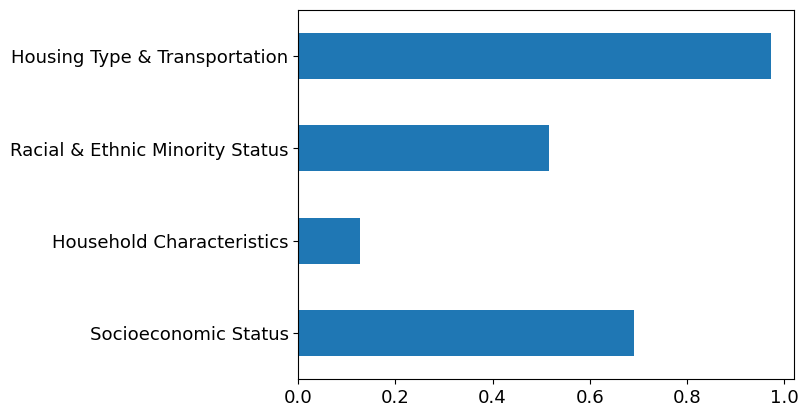

In [244]:
X_low_DVI_high_SVI.iloc[0, 16:20].plot.barh()

In [245]:
X_low_DVI_high_SVI

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone
4,104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.6916,0.1262,0.5161,0.9721,-0.526170,0.000153,0.034353,0.000307,0.000099,0.145281
356,2831.00,11.2,13.2,7.0,33.6,11.098779,21.7,25.4,24.1,14.3,...,0.8729,0.8034,0.8324,0.6984,-0.365450,0.000182,0.034150,0.000276,0.000103,0.144756
686,8233.04,15.5,14.9,9.3,33.9,13.497554,29.9,30.1,30.6,16.0,...,0.7217,0.8480,0.6761,0.8689,-0.479284,0.000158,0.033866,0.000275,0.000103,0.144872


In [246]:
xpl.filter(max_contrib=25)

## Low DVI Low SVI

In [247]:
from matplotlib import rcParams

rcParams['font.family'] = 'sans-serif'
rcParams['font.weight'] = 'normal'

In [248]:
X_low_DVI_low_SVI

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone
50,318.0,8.4,19.1,4.7,28.9,0.000000,21.4,23.0,17.2,14.7,...,0.3084,0.0353,0.5784,0.9002,-0.455122,0.000162,0.034134,0.000216,0.000103,0.144972
84,611.0,6.5,24.1,3.1,26.4,29.006526,14.0,18.8,10.4,15.6,...,0.1262,0.0012,0.3267,0.5989,-0.464823,0.000164,0.034117,0.000239,0.000108,0.144954
733,8362.0,8.8,19.3,4.8,30.2,19.620667,12.4,17.8,11.1,17.9,...,0.4134,0.0200,0.6349,0.7408,-0.470087,0.000167,0.034047,0.000428,0.000100,0.144640


In [249]:
shap_explainer = explainer(X.iloc[:, 1:])
shap_values = shap_explainer.values
shap_explainer.feature_names

['Smoking',
 'Binge Drinking',
 'Physical Inactivity',
 'Sleep<7hours',
 'Opioid Overdose',
 'High Cholesterol',
 'Obesity',
 'High Blood Pressure',
 'Depression',
 'Kidney Diseases',
 'Land Surface Temperature',
 'Air Temperature',
 'Direct Normal Irradiation',
 'Wind Speed',
 'Precipitation',
 'Socioeconomic Status',
 'Household Characteristics',
 'Racial & Ethnic Minority Status',
 'Housing Type & Transportation',
 'Aerosol ',
 'Nitrogen Dioxide ',
 'Carbon Monoxide ',
 'Sulfur Dioxide ',
 'Formaldehyde ',
 'Ozone ']

In [288]:
df_svi[df_svi['NAME10']==611]['SVI'].values

array([0.0485])

In [260]:
y.iloc[84]

0.0078334099901326

In [289]:
shap_df = pd.DataFrame(shap_values, columns=X.columns[1:])

def plot_parameter_importance(df, i, dvi, svi, align='top left'):

        
    index = df.index[i]
    name = df.iloc[i,0]
    
    dvi = np.round(y.iloc[index], 2)
    svi = np.round(df_svi[df_svi['NAME10']==name]['SVI'].values, 2)
    
    fig, ax = plt.subplots(figsize=(15, 10))
    if align == 'top left':
        ax2 = fig.add_axes([0.47, 0.72, 0.19, 0.16])
    else:
        ax2 = fig.add_axes([0.77, 0.15, 0.19, 0.16])
    color = list(map(lambda x: '#d95f02' if x >= 0 else '#1f78b4', shap_df.iloc[index].sort_values()))
    shap_df.iloc[index].sort_values().plot.barh(width=0.8, color=color, edgecolor='black', ax=ax)
    df.iloc[i, 16:20].plot.barh(width=0.8, align='center', ax=ax2)
    ax2.set_title(f"SVI: {svi}")
    ax2.set_xlabel('Contribution')
    ax.set_xlabel('Contribution')
    ax.set_title(f'Census Tract: {name} \n DVI: {dvi}')
    fig.tight_layout()
    plt.savefig(f'Final/Individual Census Tracts/{name}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return None

In [290]:
X_low_DVI_low_SVI

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone
50,318.0,8.4,19.1,4.7,28.9,0.000000,21.4,23.0,17.2,14.7,...,0.3084,0.0353,0.5784,0.9002,-0.455122,0.000162,0.034134,0.000216,0.000103,0.144972
84,611.0,6.5,24.1,3.1,26.4,29.006526,14.0,18.8,10.4,15.6,...,0.1262,0.0012,0.3267,0.5989,-0.464823,0.000164,0.034117,0.000239,0.000108,0.144954
733,8362.0,8.8,19.3,4.8,30.2,19.620667,12.4,17.8,11.1,17.9,...,0.4134,0.0200,0.6349,0.7408,-0.470087,0.000167,0.034047,0.000428,0.000100,0.144640


In [296]:
X[X['NAME10'] == 3817]

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone
408,3817.0,19.5,11.0,11.6,43.3,8.340284,28.7,39.1,42.3,13.8,...,0.0,0.0,0.0,0.0,-0.43827,0.000173,0.034055,0.000361,0.000105,0.144666


In [291]:
X_low_DVI_low_SVI

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Socioeconomic Status,Household Characteristics,Racial & Ethnic Minority Status,Housing Type & Transportation,Aerosol,Nitrogen Dioxide,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone
50,318.0,8.4,19.1,4.7,28.9,0.000000,21.4,23.0,17.2,14.7,...,0.3084,0.0353,0.5784,0.9002,-0.455122,0.000162,0.034134,0.000216,0.000103,0.144972
84,611.0,6.5,24.1,3.1,26.4,29.006526,14.0,18.8,10.4,15.6,...,0.1262,0.0012,0.3267,0.5989,-0.464823,0.000164,0.034117,0.000239,0.000108,0.144954
733,8362.0,8.8,19.3,4.8,30.2,19.620667,12.4,17.8,11.1,17.9,...,0.4134,0.0200,0.6349,0.7408,-0.470087,0.000167,0.034047,0.000428,0.000100,0.144640


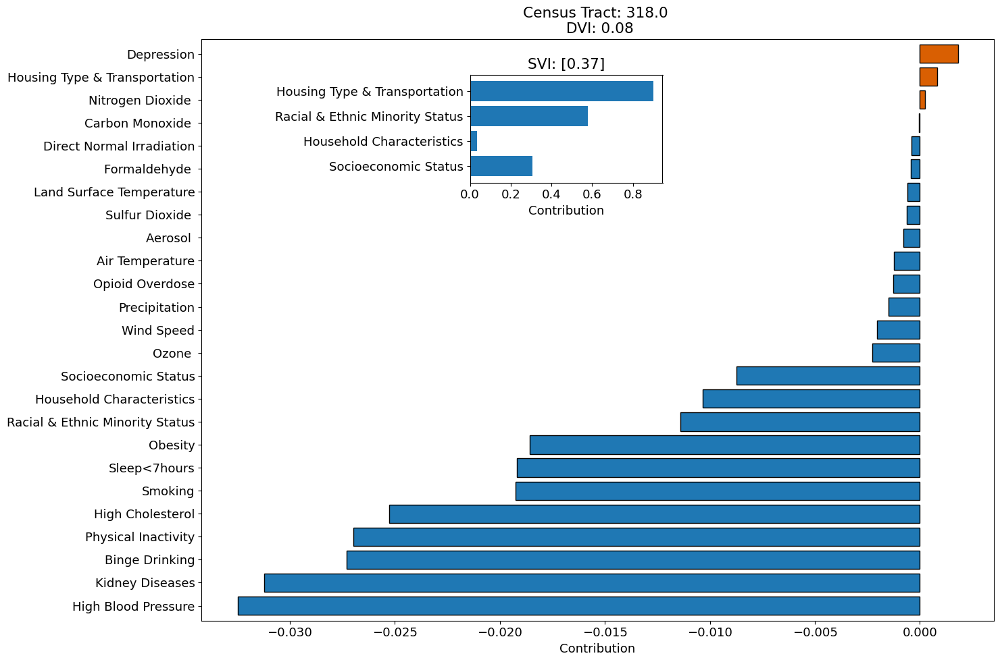

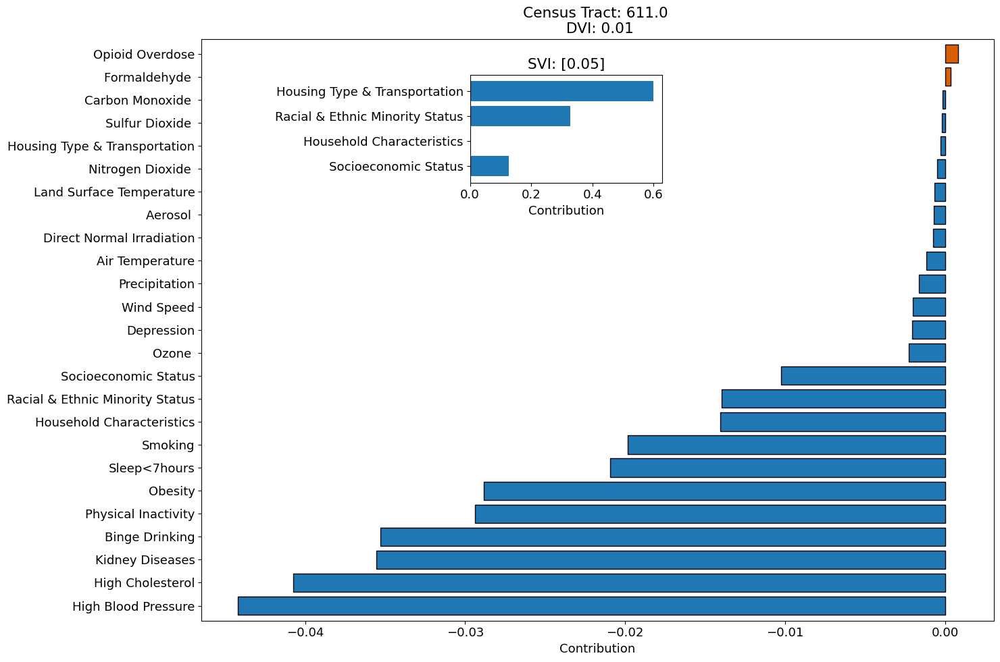

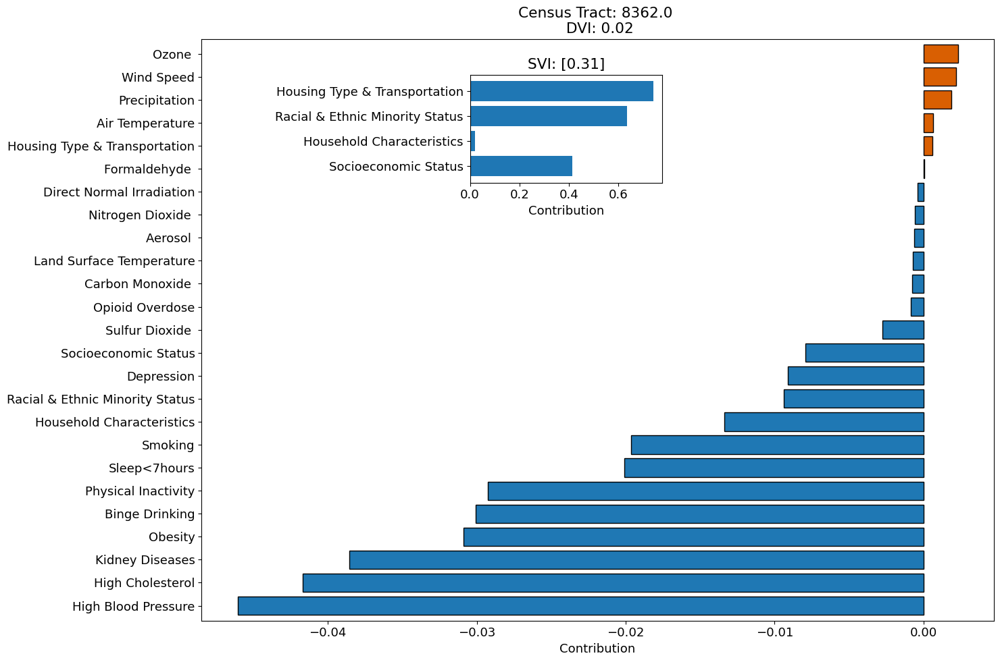

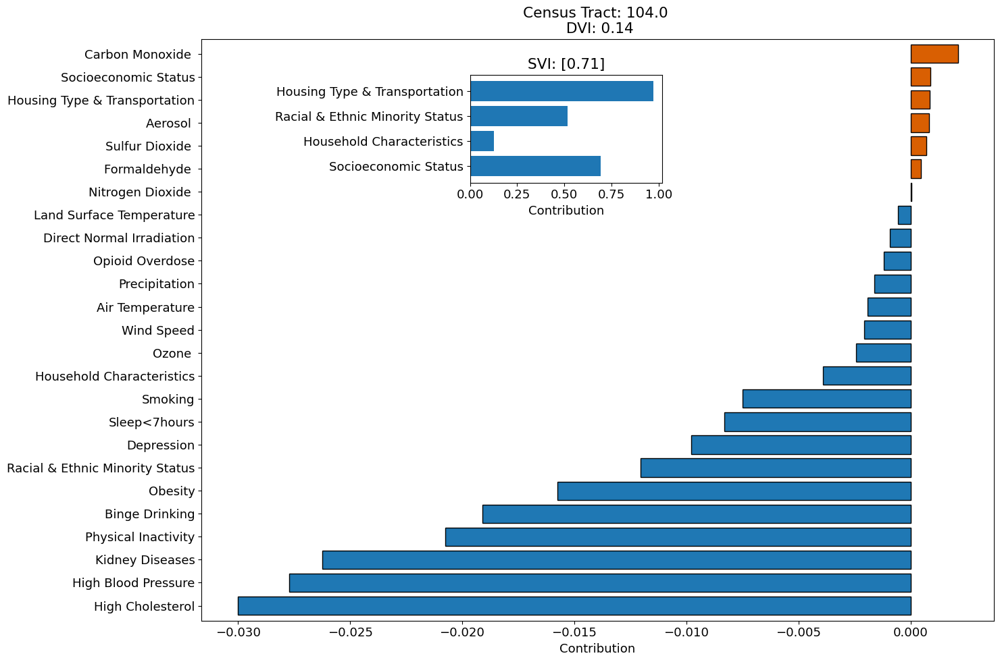

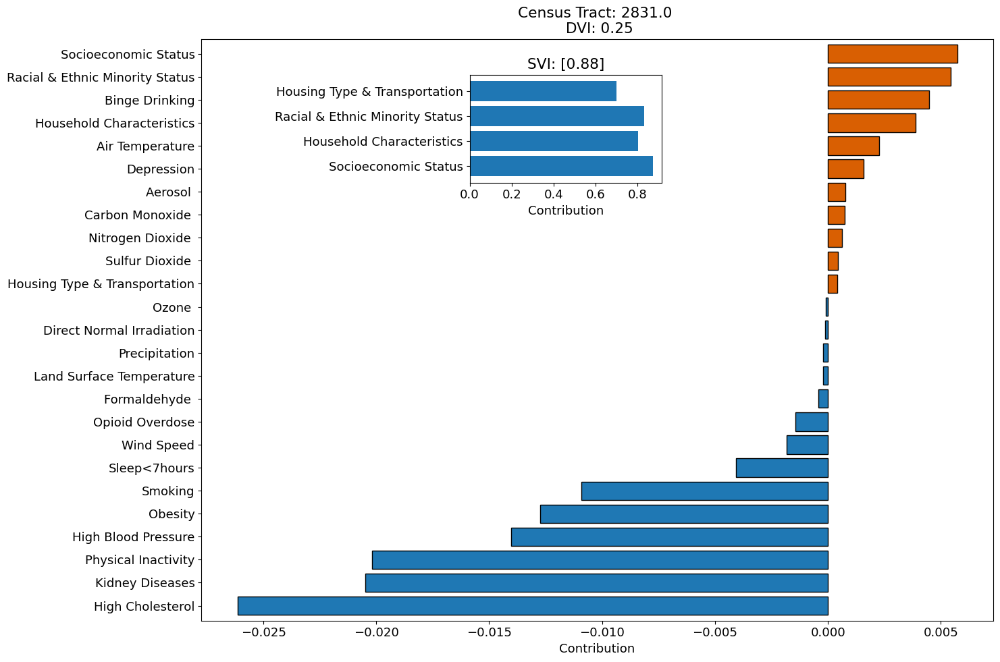

...

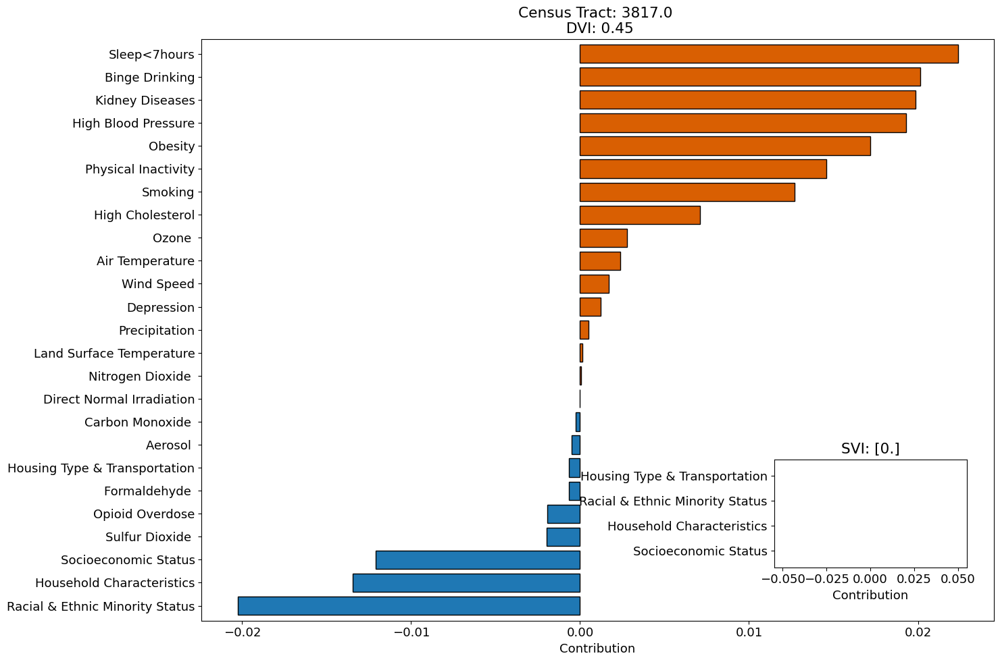

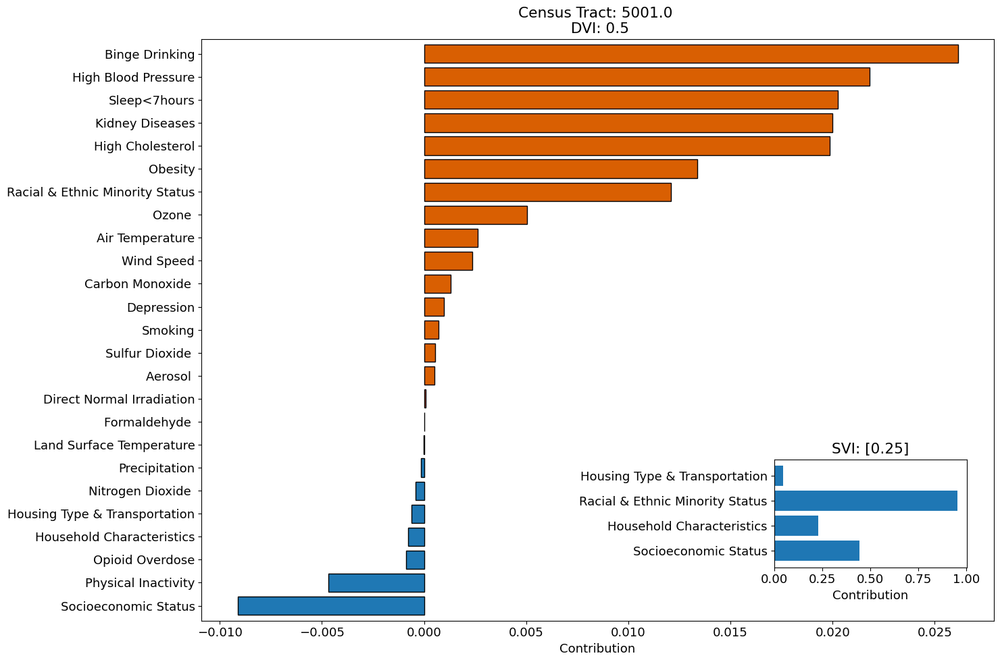

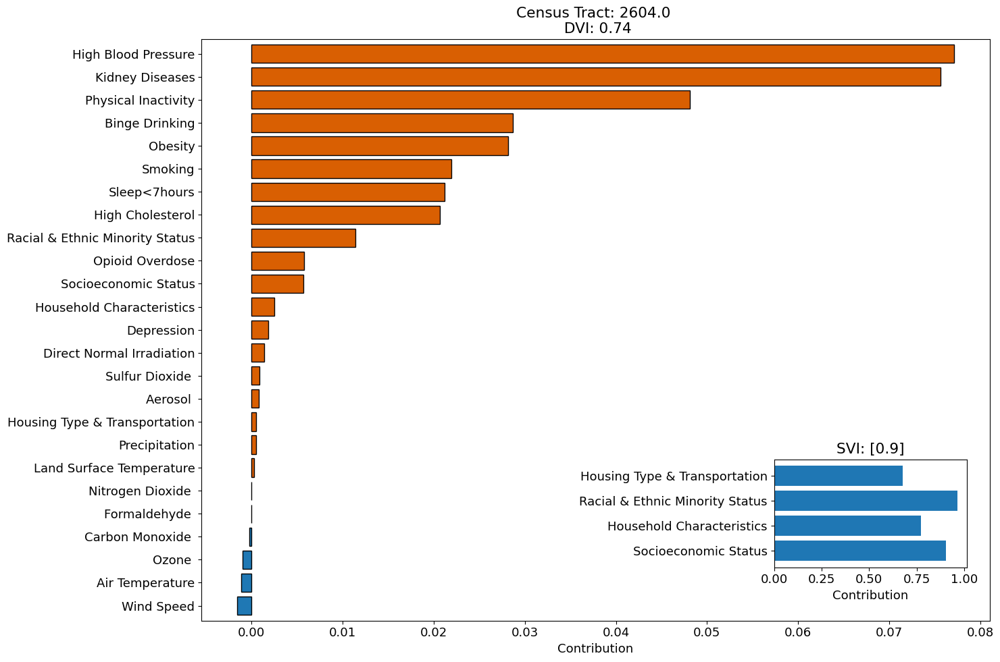

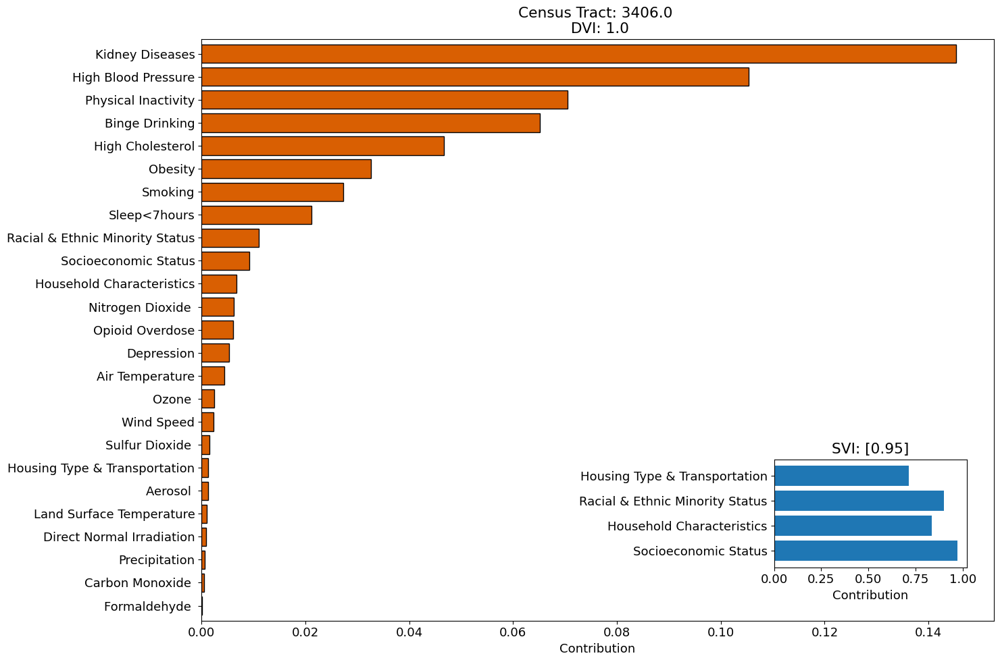

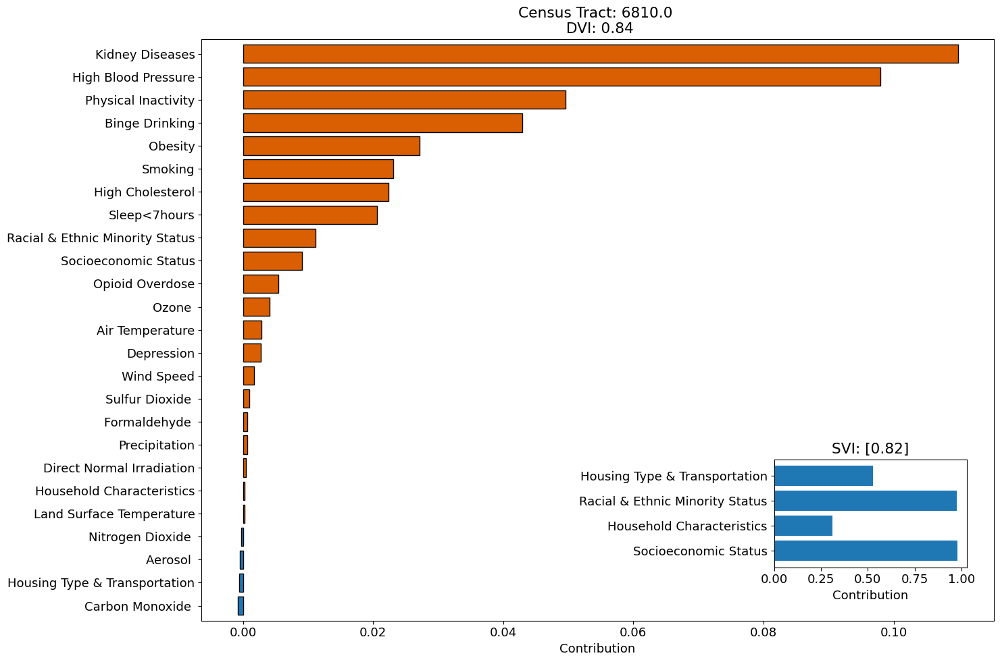

In [293]:
# top_left = [0.47, 0.72, 0.19, 0.16]
# bottom_right = [0.77, 0.15, 0.19, 0.16]

plot_parameter_importance(X_low_DVI_low_SVI, 0, 0.00, 0.05)
plot_parameter_importance(X_low_DVI_low_SVI, 1, 0.06, 0.31)
plot_parameter_importance(X_low_DVI_low_SVI, 2, 0.09, 0.37)

plot_parameter_importance(X_low_DVI_high_SVI, 0, 0.16, 0.71)
plot_parameter_importance(X_low_DVI_high_SVI, 1, 0.27, 0.88)
plot_parameter_importance(X_low_DVI_high_SVI, 2, 0.38, 0.85, align='bottom right')

plot_parameter_importance(X_high_DVI_low_SVI, 0, 0.60, 0.00, align='bottom right')
plot_parameter_importance(X_high_DVI_low_SVI, 1, 0.61, 0.25, align='bottom right')

plot_parameter_importance(X_high_DVI_high_SVI, 0, 0.93, 0.90, align='bottom right')
plot_parameter_importance(X_high_DVI_high_SVI, 1, 0.99, 0.95, align='bottom right')
plot_parameter_importance(X_high_DVI_high_SVI, 2, 1.00, 0.82, align='bottom right')

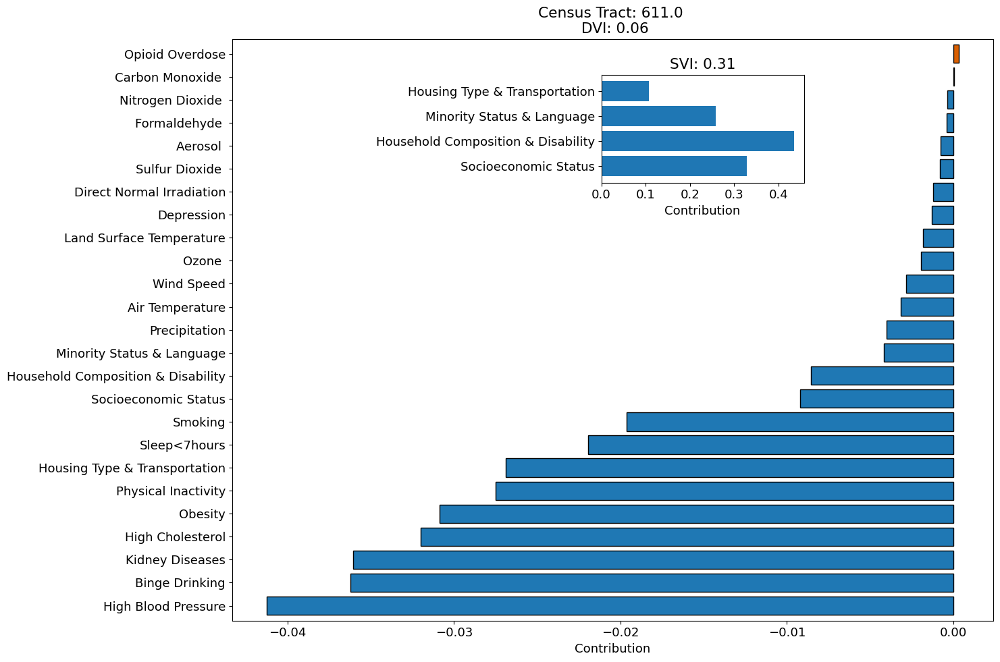

In [244]:
plot_parameter_importance(X_low_DVI_low_SVI, 1, 0.06, 0.31)

In [92]:
fig = xpl.plot.local_plot(index=X_low_DVI_low_SVI.index[1], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_low_DVI_low_SVI.iloc[1,0]} <br><sup>DVI: 0.06</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/Low DVI Low SVI {X_low_DVI_low_SVI.iloc[1,0]}.png', scale=3)

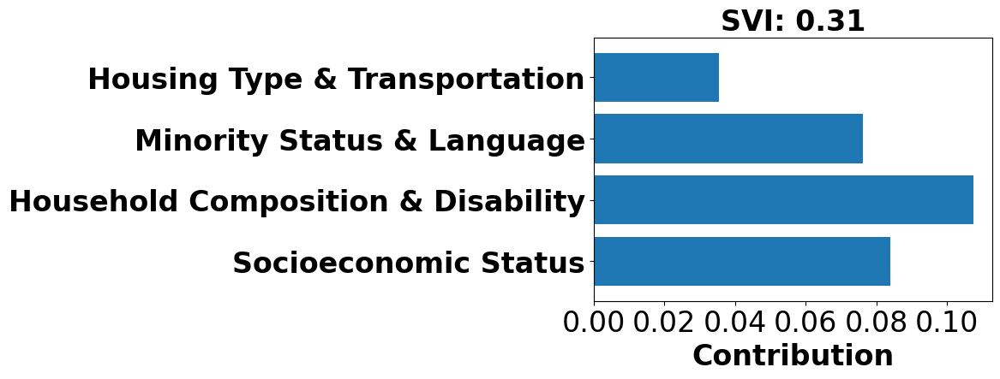

In [132]:
fig, ax = plt.subplots(figsize=(6, 4))
X_low_DVI_low_SVI.iloc[1, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.31", fontdict={'fontsize':24, 'weight':'bold'})
# plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_low_DVI_low_SVI.iloc[1,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

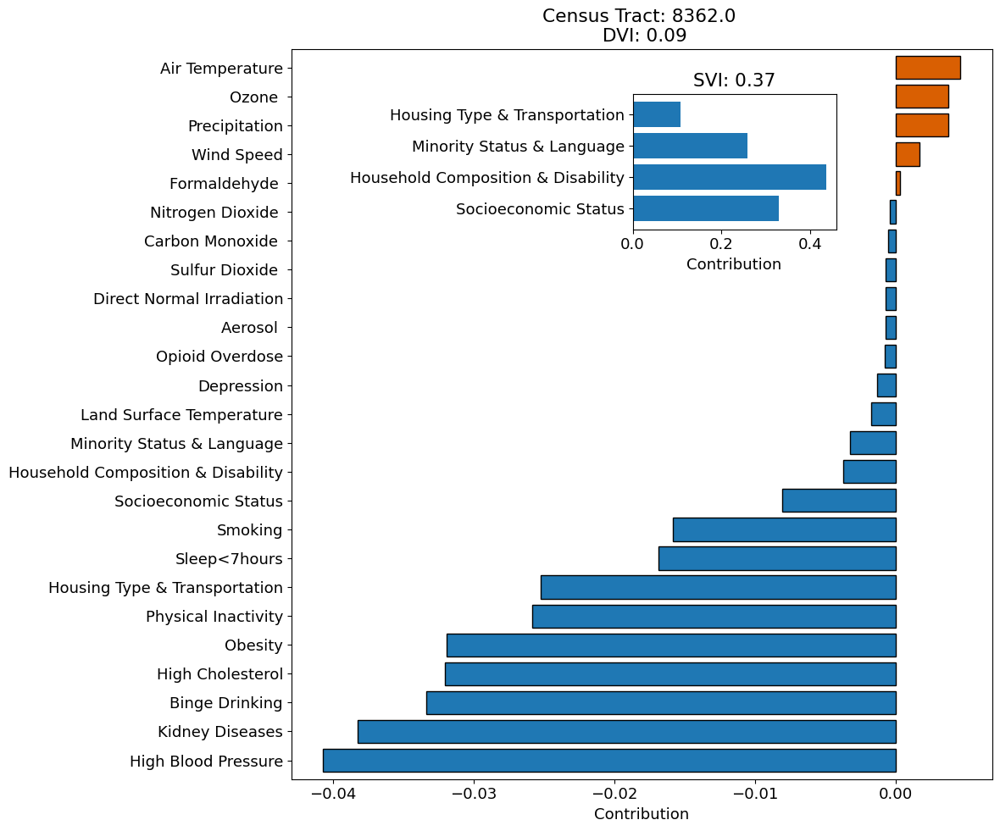

In [230]:
plot_parameter_importance(X_low_DVI_low_SVI, 2, 0.09, 0.37)

In [94]:
fig = xpl.plot.local_plot(index=X_low_DVI_low_SVI.index[2], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_low_DVI_low_SVI.iloc[2,0]} <br><sup>DVI: 0.09</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/Low DVI Low SVI {X_low_DVI_low_SVI.iloc[2,0]}.png', scale=3)

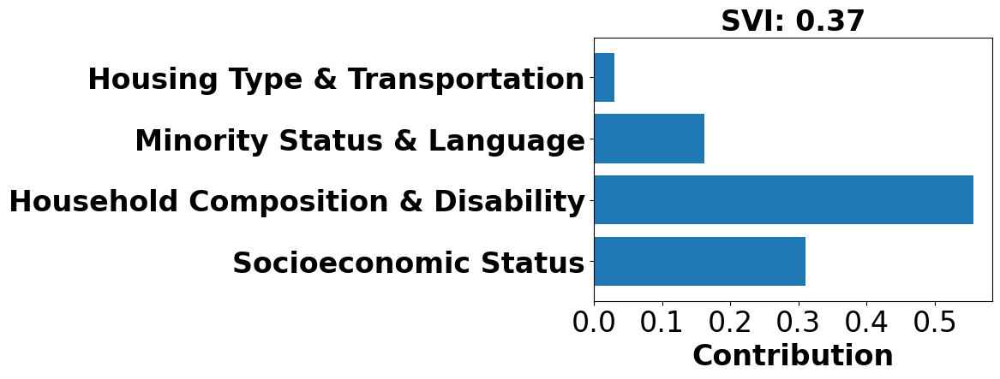

In [134]:
fig, ax = plt.subplots(figsize=(6, 4))
X_low_DVI_low_SVI.iloc[2, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.37", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_low_DVI_low_SVI.iloc[2,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

### Low DVI High SVI

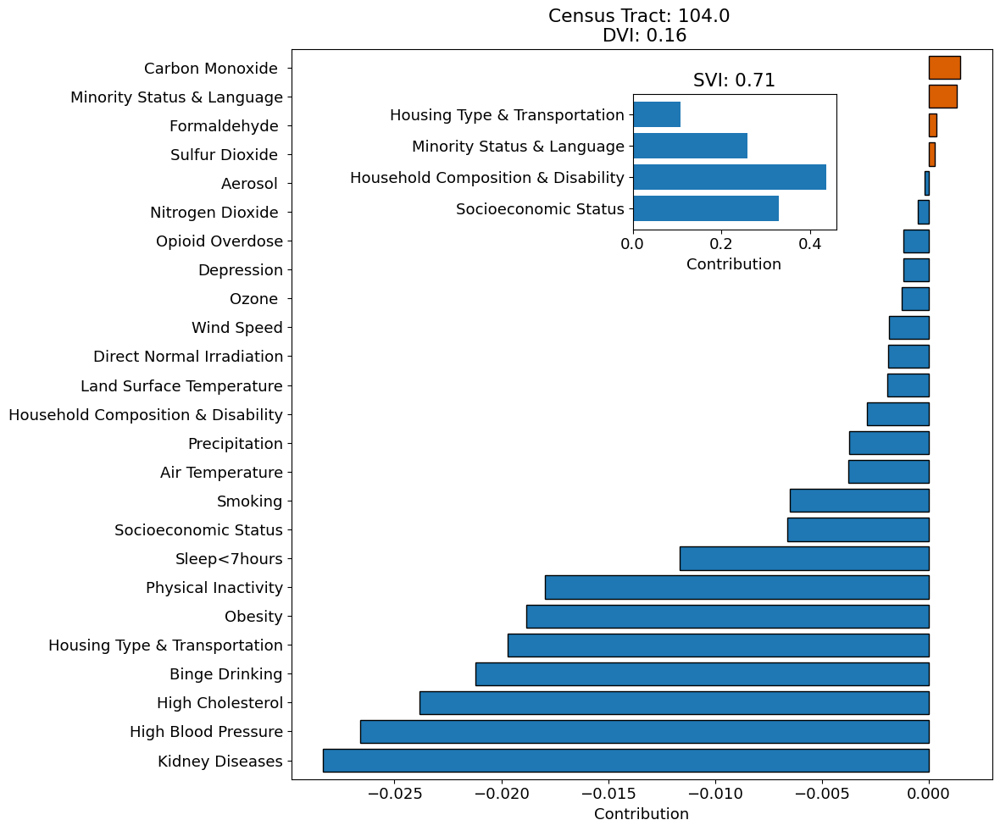

In [231]:
plot_parameter_importance(X_low_DVI_high_SVI, 0, 0.16, 0.71)
plot_parameter_importance(X_low_DVI_high_SVI, 1, 0.27, 0.88)
plot_parameter_importance(X_low_DVI_high_SVI, 2, 0.38, 0.85)

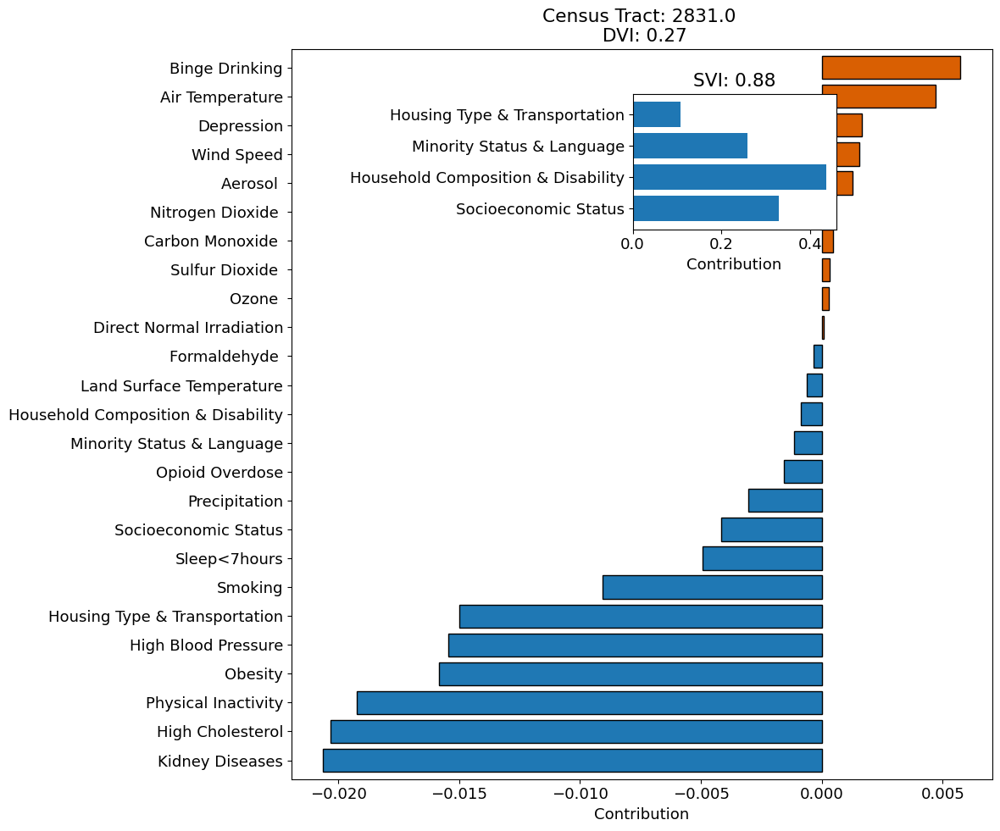

In [232]:
plot_parameter_importance(X_low_DVI_high_SVI, 1, 0.27, 0.88)

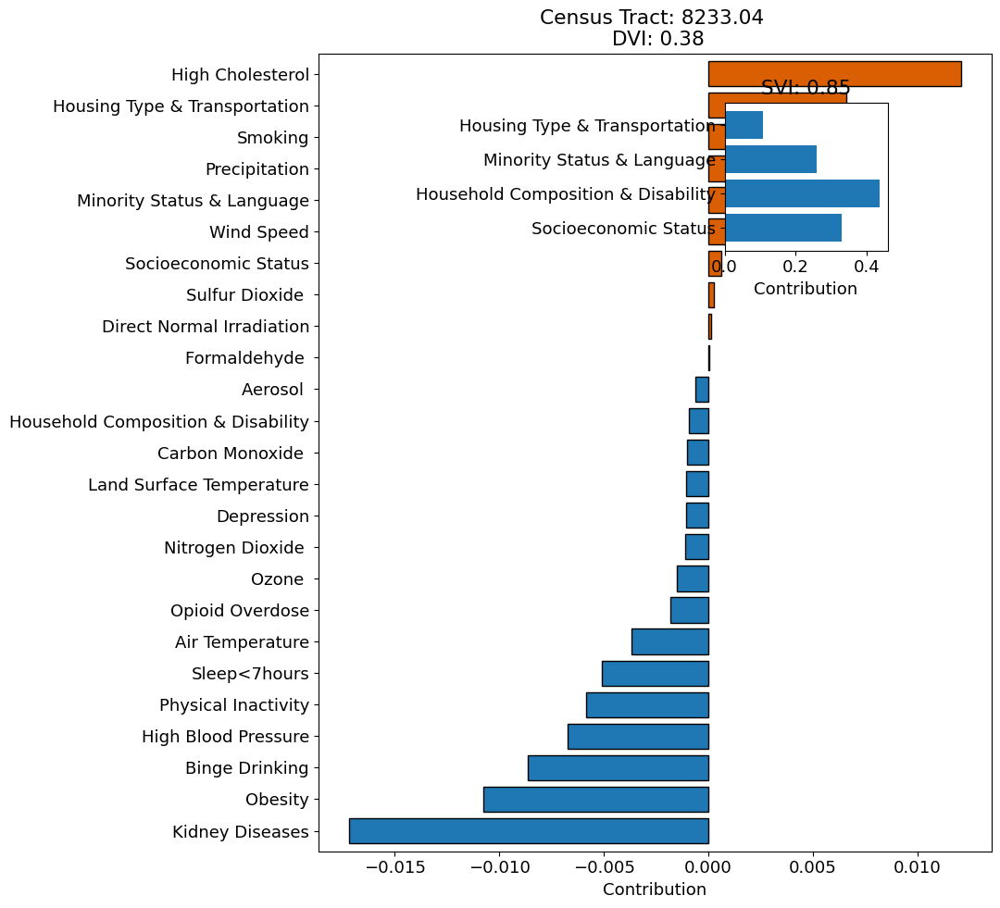

In [210]:
plot_parameter_importance(X_low_DVI_high_SVI, 2, 0.38, 0.85)

In [96]:
fig = xpl.plot.local_plot(index=X_low_DVI_high_SVI.index[0], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_low_DVI_high_SVI.iloc[0,0]} <br><sup>DVI: 0.16</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/Low DVI High SVI {X_low_DVI_high_SVI.iloc[0,0]}.png', scale=3)

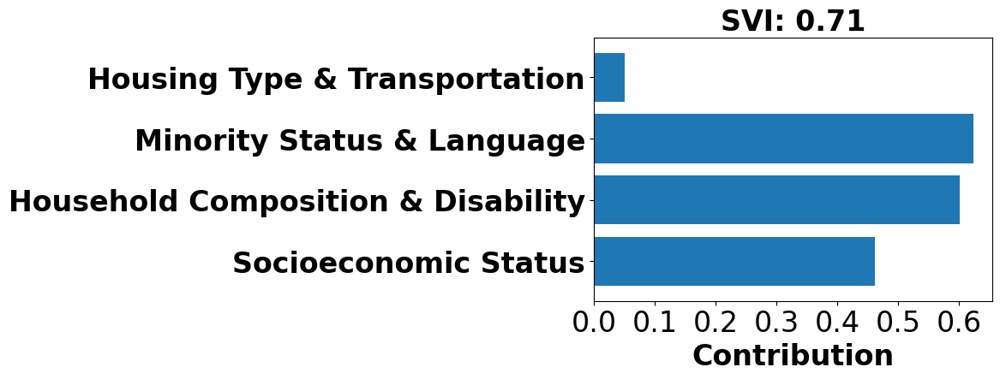

In [135]:
fig, ax = plt.subplots(figsize=(6, 4))
X_low_DVI_high_SVI.iloc[0, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.71", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_low_DVI_high_SVI.iloc[0,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [98]:
fig = xpl.plot.local_plot(index=X_low_DVI_high_SVI.index[1], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_low_DVI_high_SVI.iloc[1,0]} <br><sup>DVI: 0.27</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/Low DVI High SVI {X_low_DVI_high_SVI.iloc[1,0]}.png', scale=3)

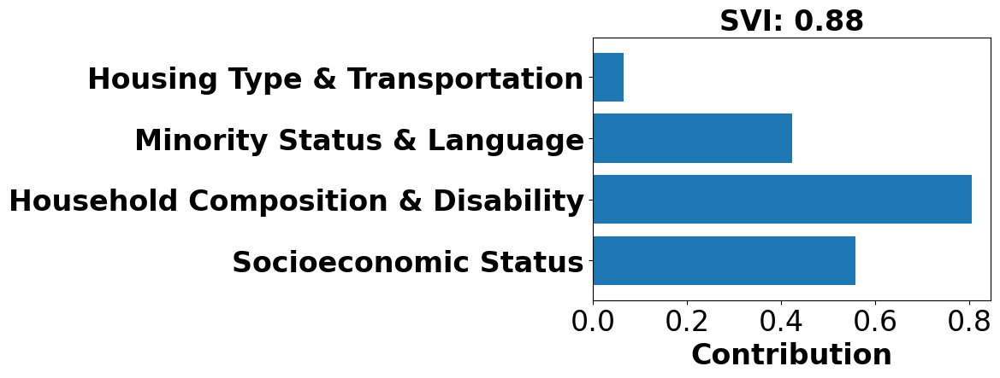

In [136]:
fig, ax = plt.subplots(figsize=(6, 4))
X_low_DVI_high_SVI.iloc[1, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.88", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_low_DVI_high_SVI.iloc[1,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [100]:
fig = xpl.plot.local_plot(index=X_low_DVI_high_SVI.index[2], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_low_DVI_high_SVI.iloc[2,0]} <br><sup>DVI: 0.38</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/Low DVI High SVI {X_low_DVI_high_SVI.iloc[2,0]}.png', scale=3)

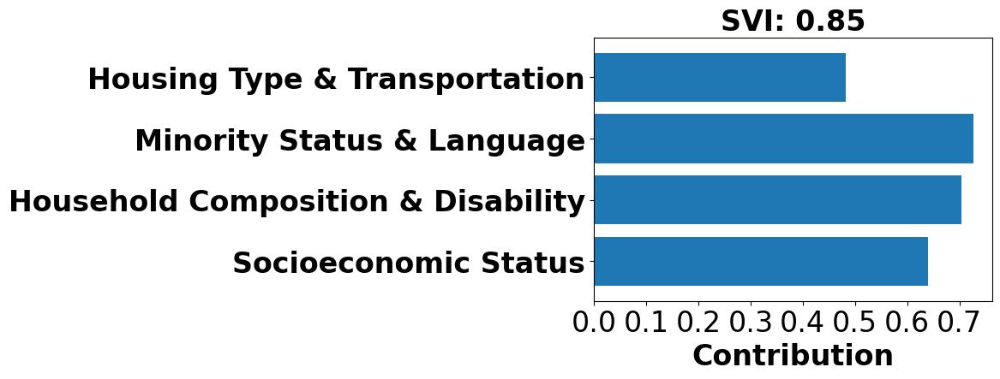

In [137]:
fig, ax = plt.subplots(figsize=(6, 4))
X_low_DVI_high_SVI.iloc[2, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.85", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_low_DVI_high_SVI.iloc[2,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

## High DVI Low SVI

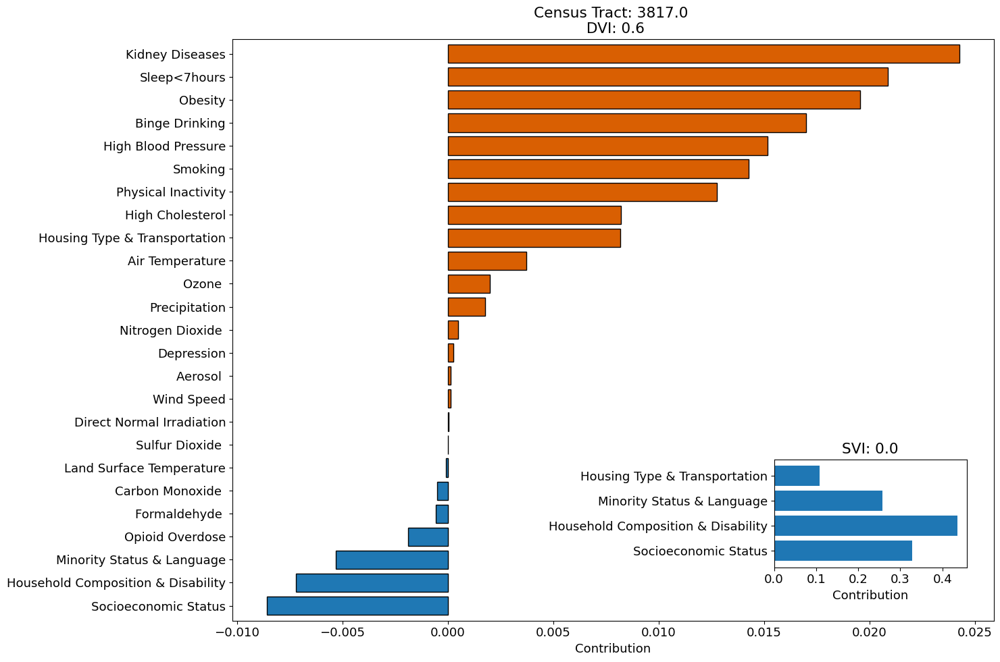

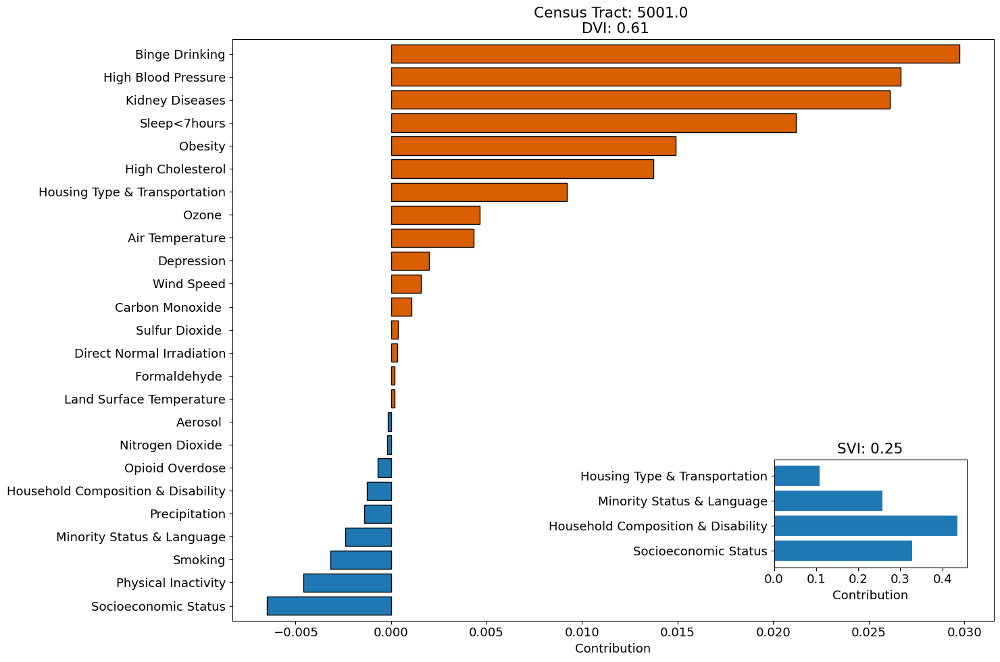

In [269]:
plot_parameter_importance(X_high_DVI_low_SVI, 0, 0.60, 0.00, align='bottom right')
plot_parameter_importance(X_high_DVI_low_SVI, 1, 0.61, 0.25, align='bottom right')

In [102]:
fig = xpl.plot.local_plot(index=X_high_DVI_low_SVI.index[0], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_high_DVI_low_SVI.iloc[0,0]} <br><sup>DVI: 0.60</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/High DVI Low SVI {X_high_DVI_low_SVI.iloc[0,0]}.png', scale=3)

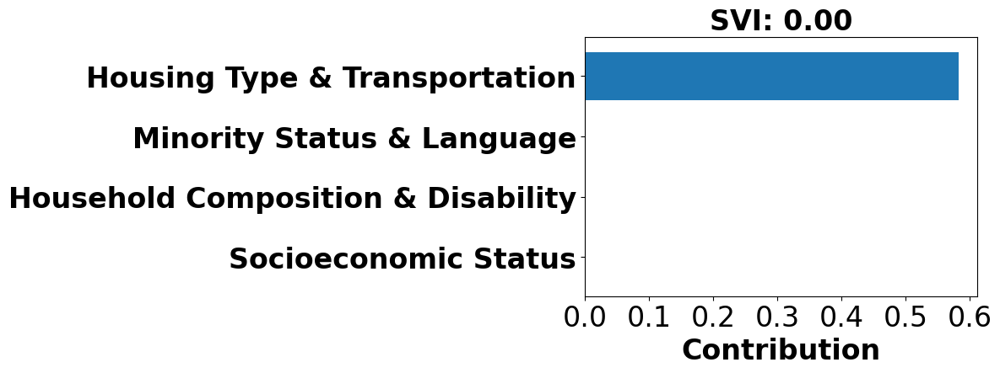

In [138]:
fig, ax = plt.subplots(figsize=(6, 4))
X_high_DVI_low_SVI.iloc[0, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.00", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_high_DVI_low_SVI.iloc[0,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [104]:
fig = xpl.plot.local_plot(index=X_high_DVI_low_SVI.index[1], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_high_DVI_low_SVI.iloc[1,0]} <br><sup>DVI: 0.61</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/High DVI Low SVI {X_high_DVI_low_SVI.iloc[1,0]}.png', scale=3)

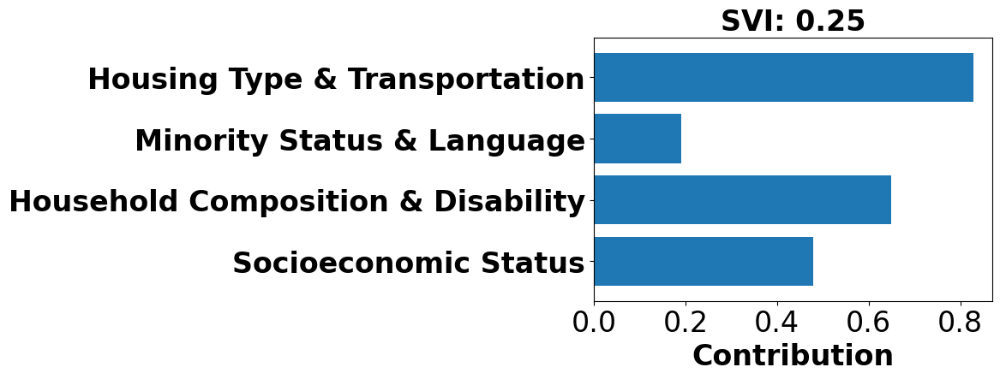

In [139]:
fig, ax = plt.subplots(figsize=(6, 4))
X_high_DVI_low_SVI.iloc[1, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.25", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_high_DVI_low_SVI.iloc[1,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

## High DVI High SVI

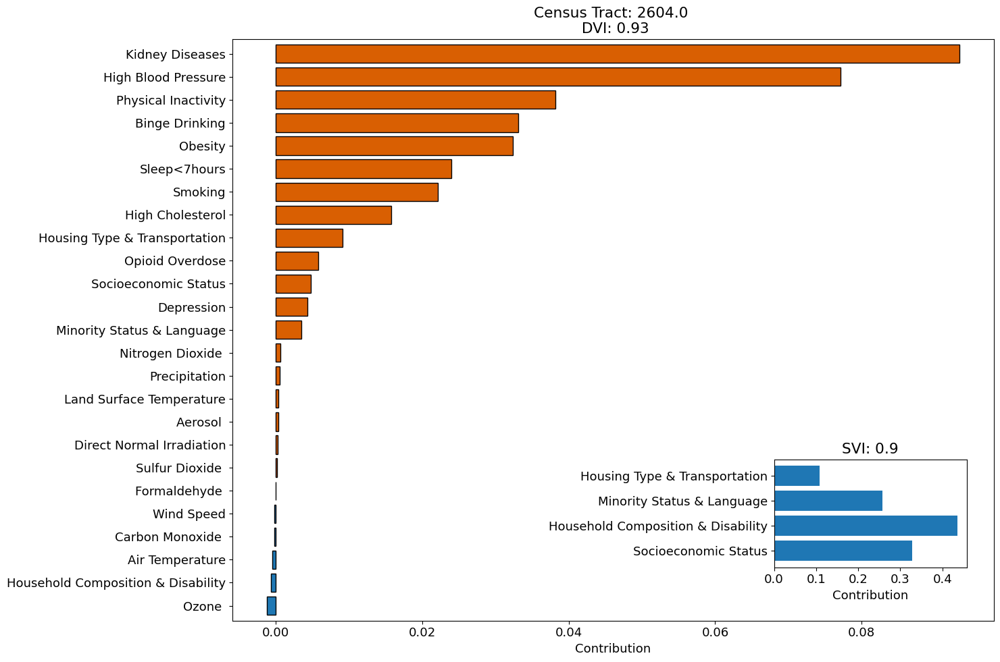

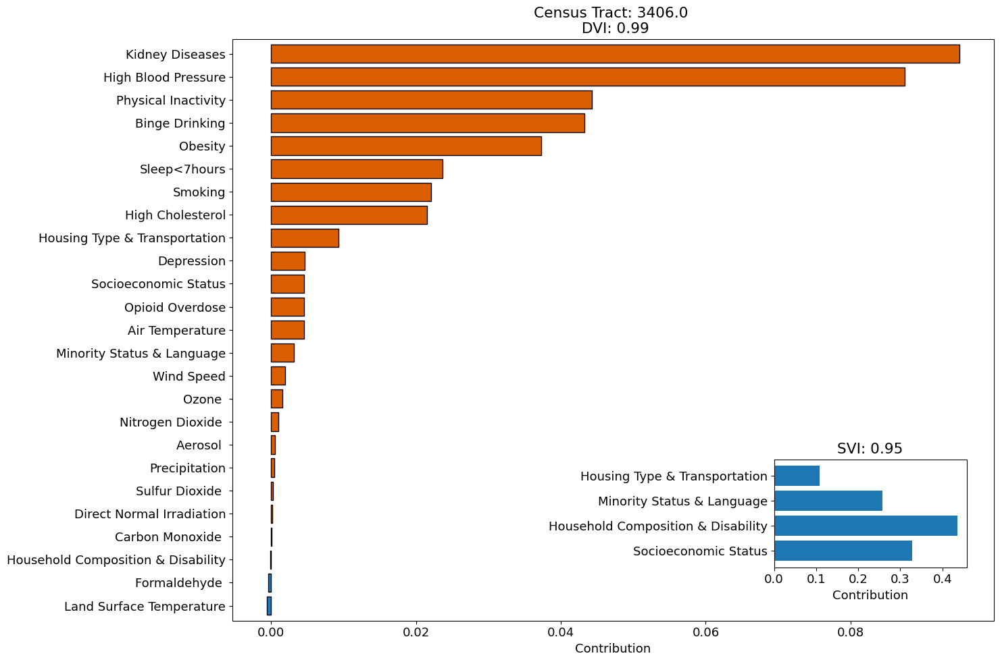

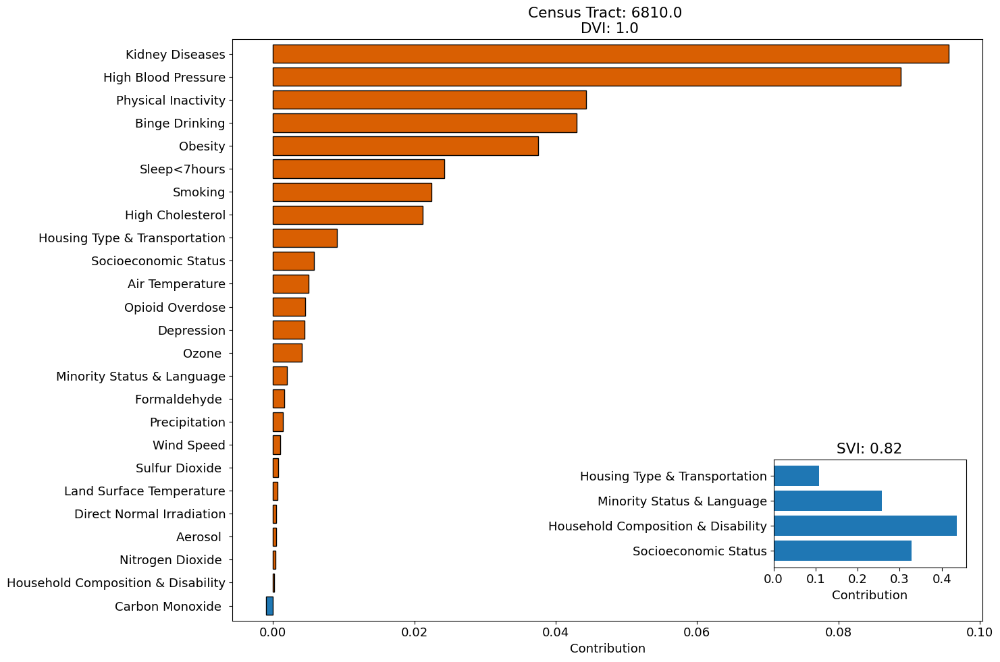

In [270]:
plot_parameter_importance(X_high_DVI_high_SVI, 0, 0.93, 0.90, align='bottom right')
plot_parameter_importance(X_high_DVI_high_SVI, 1, 0.99, 0.95, align='bottom right')
plot_parameter_importance(X_high_DVI_high_SVI, 2, 1.00, 0.82, align='bottom right')

In [106]:
fig = xpl.plot.local_plot(index=X_high_DVI_high_SVI.index[0], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_high_DVI_high_SVI.iloc[0,0]} <br><sup>DVI: 0.93</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/High DVI High SVI {X_high_DVI_high_SVI.iloc[0,0]}.png', scale=3)

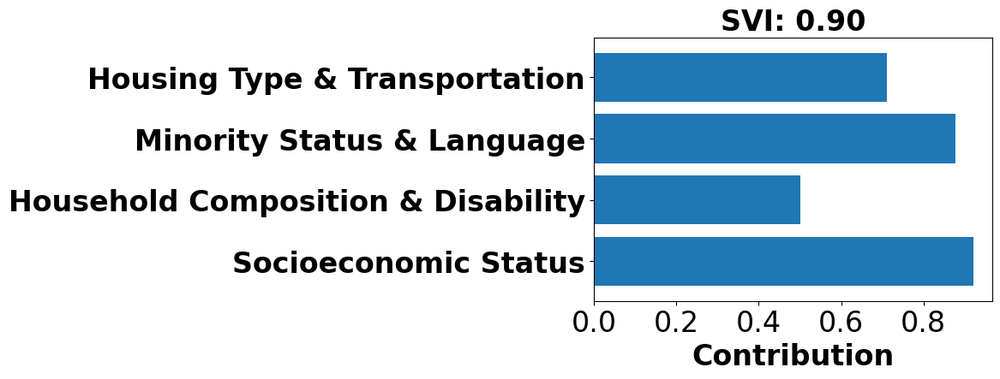

In [140]:
fig, ax = plt.subplots(figsize=(6, 4))
X_high_DVI_high_SVI.iloc[0, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.90", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_high_DVI_high_SVI.iloc[0,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [108]:
fig = xpl.plot.local_plot(index=X_high_DVI_high_SVI.index[1], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_high_DVI_high_SVI.iloc[1,0]} <br><sup>DVI: 0.99</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/High DVI High SVI {X_high_DVI_high_SVI.iloc[1,0]}.png', scale=3)

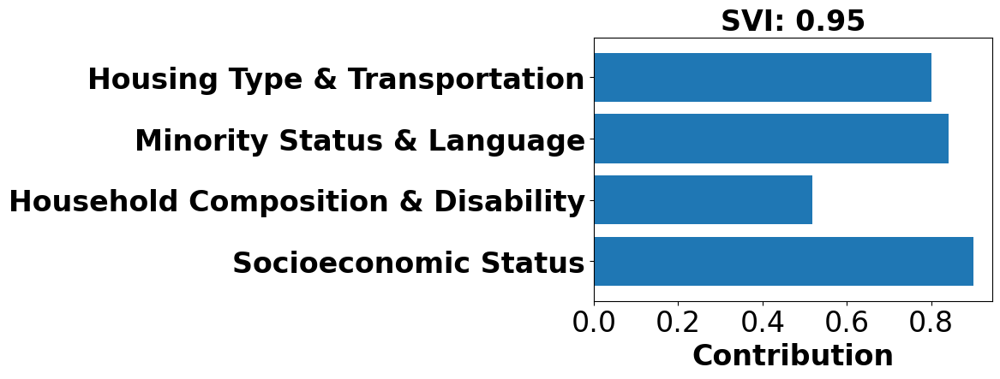

In [141]:
fig, ax = plt.subplots(figsize=(6, 4))
X_high_DVI_high_SVI.iloc[1, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.95", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_high_DVI_high_SVI.iloc[1,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [110]:
fig = xpl.plot.local_plot(index=X_high_DVI_high_SVI.index[2], show_predict=False, width=650, height=700)
fig.update_layout(font=dict(family="sans-serif",
                            color="Black",
                            size=14,
                           ),
                  margin=dict(t=110),
                  title=dict(text=f"Census Tract: {X_high_DVI_high_SVI.iloc[2,0]} <br><sup>DVI: 1.00</sup>" )
                 )
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file=f'Final/Individual Census Tracts/High DVI High SVI {X_high_DVI_high_SVI.iloc[2,0]}.png', scale=3)

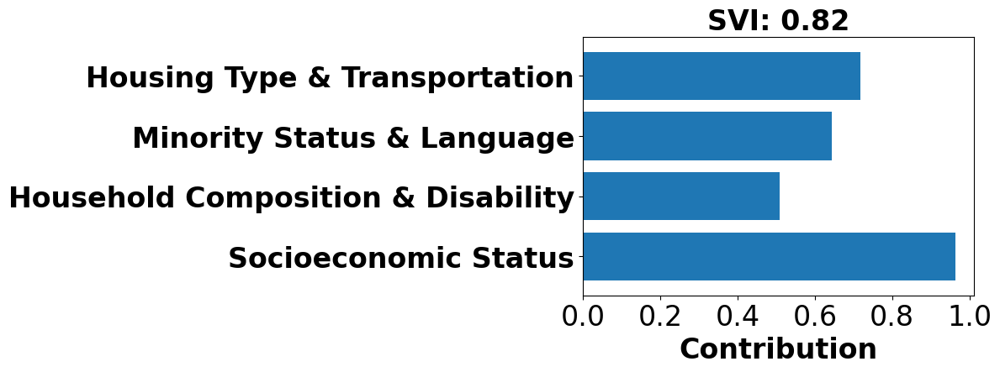

In [142]:
fig, ax = plt.subplots(figsize=(6, 4))
X_high_DVI_high_SVI.iloc[2, 16:20].plot.barh(width=0.8, align='center')
plt.xlabel("Contribution", fontdict={'fontsize':24, 'weight':'bold'})
plt.xticks(fontsize=24)
plt.yticks(fontsize=24, weight='bold')
plt.title(f"SVI: 0.82", fontdict={'fontsize':24, 'weight':'bold'})
plt.savefig(f'Final/Individual Census Tracts/SVI Themes {X_high_DVI_high_SVI.iloc[2,0]}.png', dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

In [112]:
df_test = pd.read_csv('Final/Data/AllParameters and Vulnerability Classes.csv', index_col=0)
df_test

,NAME10,Smoking,Binge Drinking,Physical Inactivity,Sleep<7hours,Opioid Overdose,High Cholesterol,Obesity,High Blood Pressure,Depression,...,Carbon Monoxide,Sulfur Dioxide,Formaldehyde,Ozone,Diabetes,Diabetes_pred,Vulnerability_Class,Vulnerability_ClassNum,Diabetes_Class,Diabetes_ClassNum
0,101.00,16.4,13.8,9.4,37.5,41.203131,26.2,34.5,31.3,15.6,...,0.034224,0.000291,0.000101,0.145337,0.362989,0.405278,Moderate,3,Low,2
1,102.01,20.5,13.9,11.2,38.7,20.155039,26.2,36.3,31.1,16.3,...,0.034112,0.000288,0.000101,0.145342,0.395018,0.463308,Moderate,3,Moderate,3
2,102.02,19.1,13.4,11.5,37.3,53.229241,29.6,35.1,34.6,15.7,...,0.034112,0.000288,0.000101,0.145342,0.448399,0.517468,Moderate,3,Moderate,3
3,103.00,14.5,14.2,8.9,34.1,20.846697,29.0,30.2,31.4,14.7,...,0.034224,0.000291,0.000100,0.145337,0.355872,0.373402,Low,2,Low,2
4,104.00,11.9,16.6,6.9,32.1,17.850060,20.4,24.9,20.0,17.7,...,0.034353,0.000307,0.000099,0.145281,0.206406,0.156437,Very Low,1,Very Low,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
796,8435.00,30.4,16.5,12.7,44.9,15.032275,22.3,41.0,34.0,14.7,...,0.034137,0.000283,0.000099,0.144767,0.398577,0.455618,Moderate,3,Moderate,3
797,8436.00,15.7,11.0,9.7,41.5,42.750267,26.7,38.1,38.4,13.9,...,0.034080,0.000374,0.000106,0.144690,0.455516,0.527422,Moderate,3,Moderate,3
798,8437.00,11.8,17.7,6.4,30.3,18.894662,24.7,25.4,21.5,15.6,...,0.034040,0.000206,0.000102,0.144954,0.220641,0.196576,Very Low,1,Very Low,1
799,8438.00,20.6,12.3,12.1,40.4,42.654028,28.7,37.3,36.9,15.7,...,0.034040,0.000312,0.000102,0.144670,0.491103,0.582953,High,4,Moderate,3


In [172]:
sel = df_all_params[df_all_params['Vulnerability_ClassNum'] == 1].index
fig = xpl.plot.features_importance(selection=sel, max_features=25, width=600, height=750)
fig.update_traces(name='Very Low', selector=dict(name='Subset'))
fig.update_layout(
    font=dict(
        family="sans-serif",
        size=18,  # Set the font size here
        color="Black"
    ),
    margin=dict(t=110)
)
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file='Very Low Vulnerability.png', scale=3)

In [173]:
sel = df_all_params[df_all_params['Vulnerability_ClassNum'] == 2].index
fig = xpl.plot.features_importance(selection=sel, max_features=25, width=600, height=750)
fig.update_traces(name='Low', selector=dict(name='Subset'))
fig.update_layout(
    font=dict(
        family="sans-serif",
        size=18,  # Set the font size here
        color="Black"
    ),
    margin=dict(t=110)
)
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file='Low Vulnerability.png', scale=3)

In [174]:
sel = df_all_params[df_all_params['Vulnerability_ClassNum'] == 3].index
fig = xpl.plot.features_importance(selection=sel, max_features=25, width=600, height=750)
fig.update_traces(name='Moderate', selector=dict(name='Subset'))
fig.update_layout(
    font=dict(
        family="sans-serif",
        size=18,  # Set the font size here
        color="Black"
    ),
    margin=dict(t=110)
)
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file='Moderate Vulnerability.png', scale=3)

In [175]:
sel = df_all_params[df_all_params['Vulnerability_ClassNum'] == 4].index
fig = xpl.plot.features_importance(selection=sel, max_features=25, width=600, height=750)
fig.update_traces(name='High', selector=dict(name='Subset'))
fig.update_layout(
    font=dict(
        family="sans-serif",
        size=18,  # Set the font size here
        color="Black"
    ),
    margin=dict(t=110)
)
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file='High Vulnerability.png', scale=3)

In [176]:
sel = df_all_params[df_all_params['Vulnerability_ClassNum'] == 5].index
fig = xpl.plot.features_importance(selection=sel, max_features=25, width=600, height=750)
fig.update_traces(name='Very High', selector=dict(name='Subset'))
fig.update_layout(
    font=dict(
        family="sans-serif",
        size=18,  # Set the font size here
        color="Black"
    ),
    margin=dict(t=110)
)
fig.update_xaxes(title_font_family="sans-serif")
pio.write_image(fig, file='Very High Vulnerability.png', scale=3)

In [147]:
import shap

In [146]:
shap_values = explainer.shap_values(X)

shap.force_plot(explainer.expected_value, shap_values, X)

In [13]:
# V. High: 6810, 3406, 2604
# Moderate: 8305, 5202, 2306
# V. Low: 611, 318, 8362
v_high = [6810, 3406, 2604]
moderate = [8305, 5202, 2306]
v_low = [611, 318, 8362]

In [14]:
X_v_high = X[X['NAME10'].isin(v_high)]
X_moderate = X[X['NAME10'].isin(moderate)]
X_v_low = X[X['NAME10'].isin(v_low)]

In [149]:
shap_explainer = explainer(X.iloc[:, 1:])
shap_values = shap_explainer.values
shap_explainer.feature_names
shap_values.shape

(801, 26)

In [153]:
shap_explainer.feature_names

['Smoking',
 'Binge Drinking',
 'Physical Inactivity',
 'Sleep<7hours',
 'Opioid Overdose',
 'High Cholesterol',
 'Obesity',
 'High Blood Pressure',
 'Depression',
 'Kidney Diseases',
 'Land Surface Temperature',
 'Air Temperature',
 'Direct Normal Irradiation',
 'Wind Speed',
 'Precipitation',
 'Socioeconomic\xa0Status',
 'Household Composition & Disability',
 'Minority Status & Language',
 'Housing Type & Transportation',
 'Aerosol ',
 'Nitrogen Dioxide ',
 'Carbon Monoxide ',
 'Sulfur Dioxide ',
 'Formaldehyde ',
 'Ozone ']

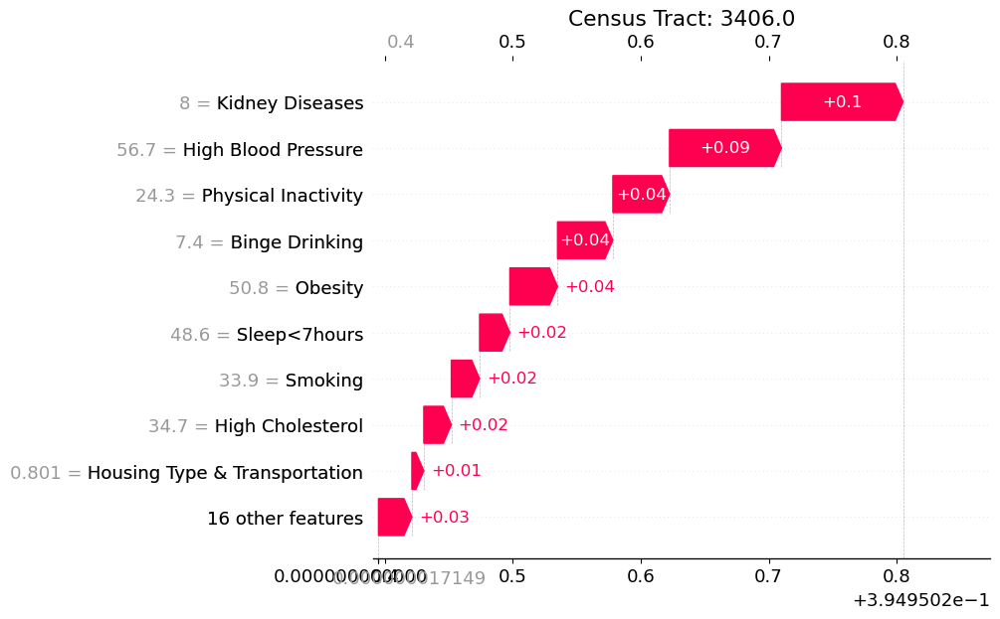

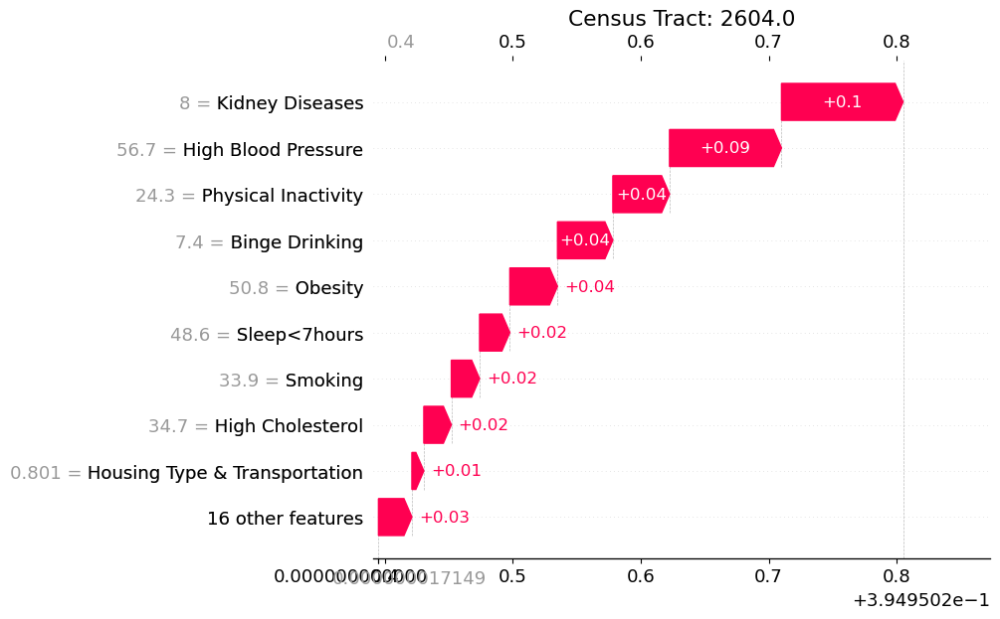

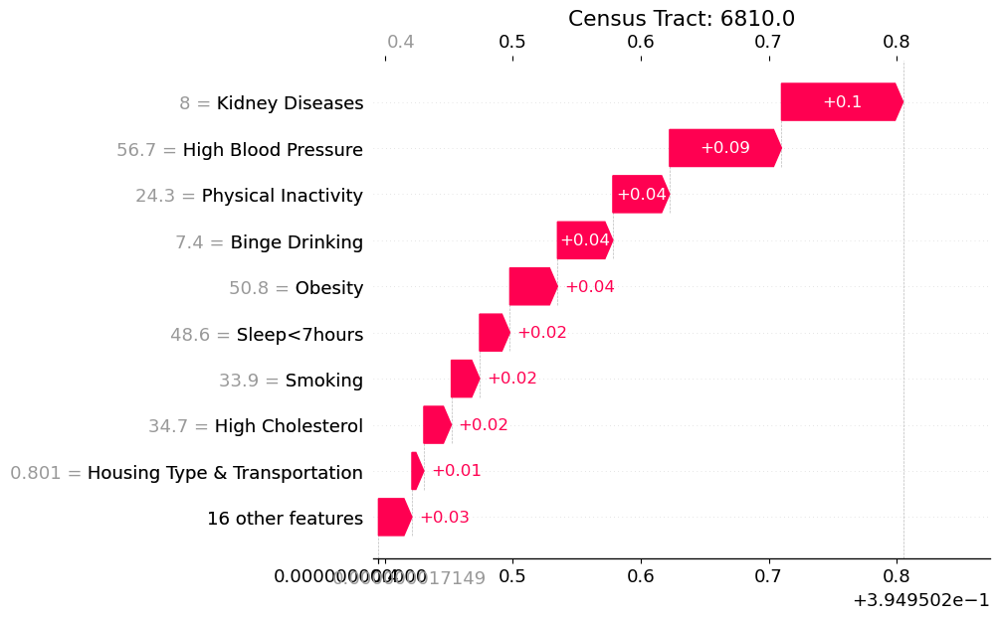

In [16]:
# ax = axs.ravel()
for i in range(len(X_v_high)):
    fig, axs = plt.subplots()
    shap.plots.waterfall(shap_explainer[X_v_high.index[0]], max_display=10, show=False)
#     shap.plots.waterfall(shap_explainer[X_v_high.index[1]], max_display=25, show=True, ax=ax[1])
    plt.title(f"Census Tract: {X_v_high.iloc[i]['NAME10']}")
fig.savefig(f"../../Data/saved_data/Census Tract/High_{X_v_high.iloc[i]['NAME10']}.jpg", dpi=300, bbox_inches='tight')
plt.show()

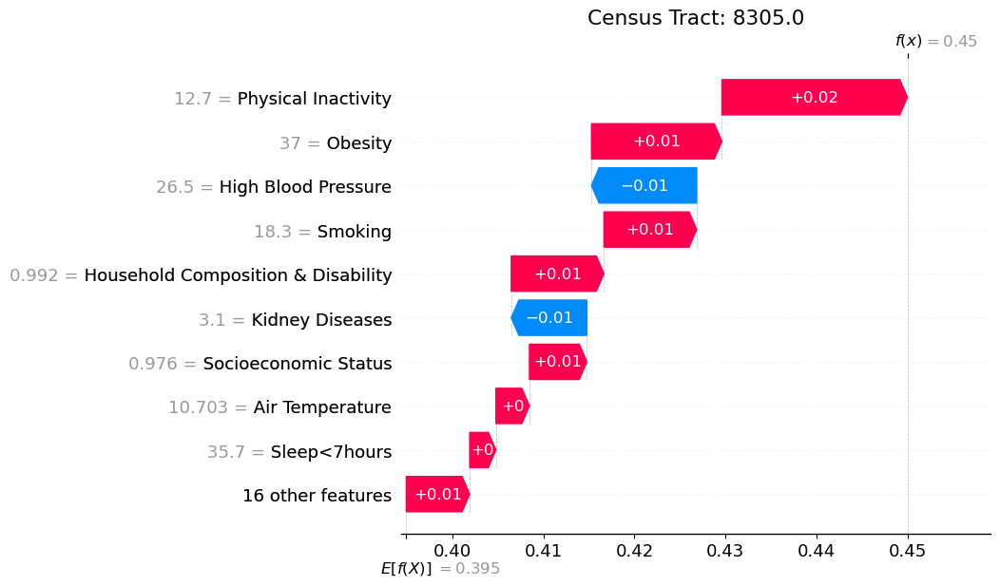

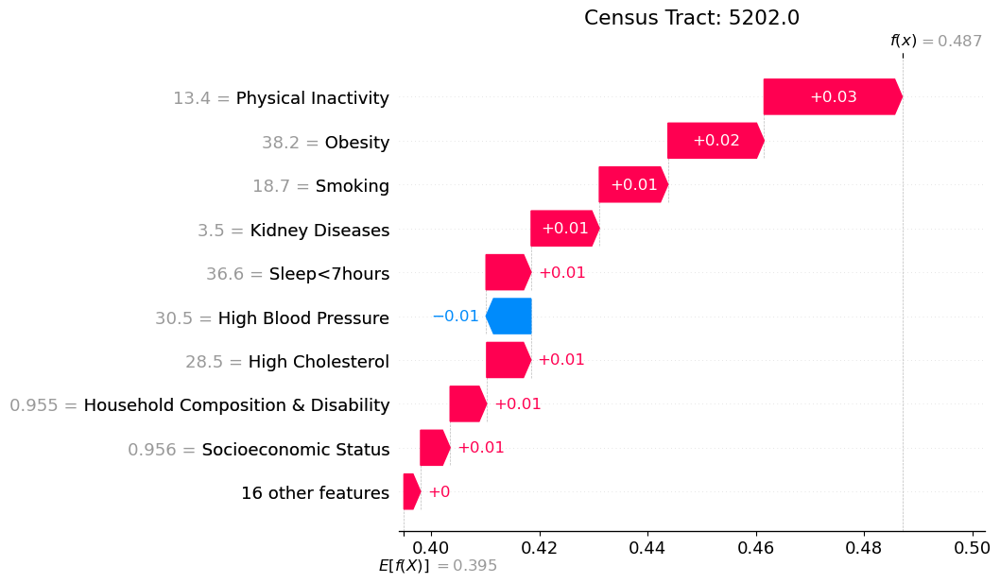

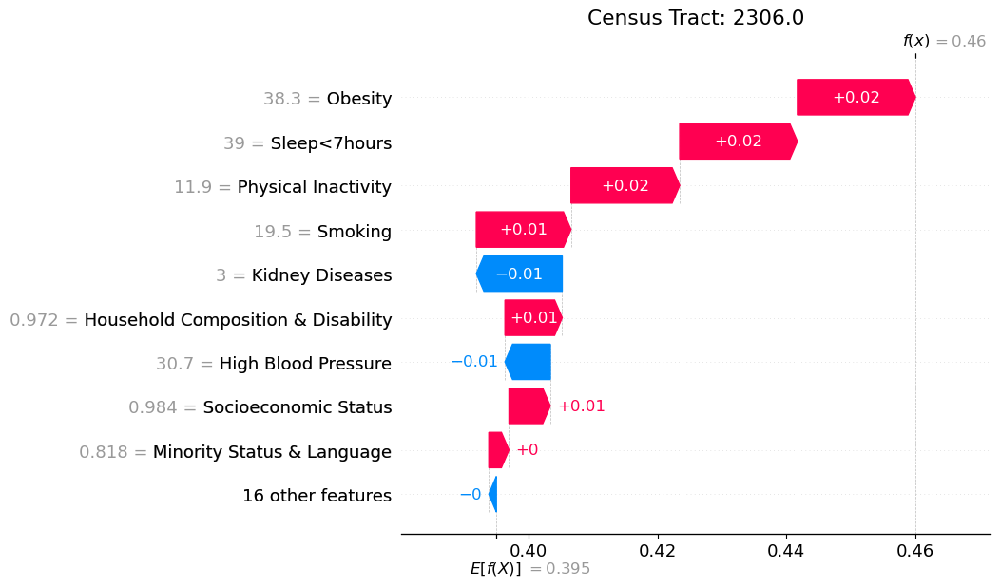

In [17]:
for i in range(len(X_moderate)):
    fig, ax = plt.subplots(figsize=(15, 16))
    shap.plots.waterfall(shap_explainer[X_moderate.index[i]], max_display=10, show=False)
    plt.title(f"Census Tract: {X_moderate.iloc[i]['NAME10']}")
    fig.savefig(f"../../Data/saved_data/Census Tract/Moderate_{X_moderate.iloc[i]['NAME10']}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

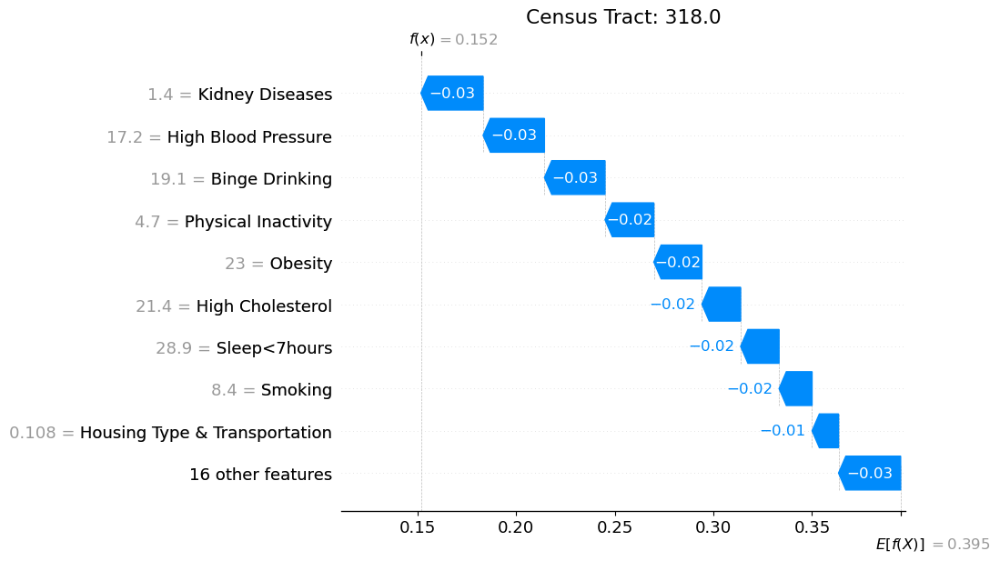

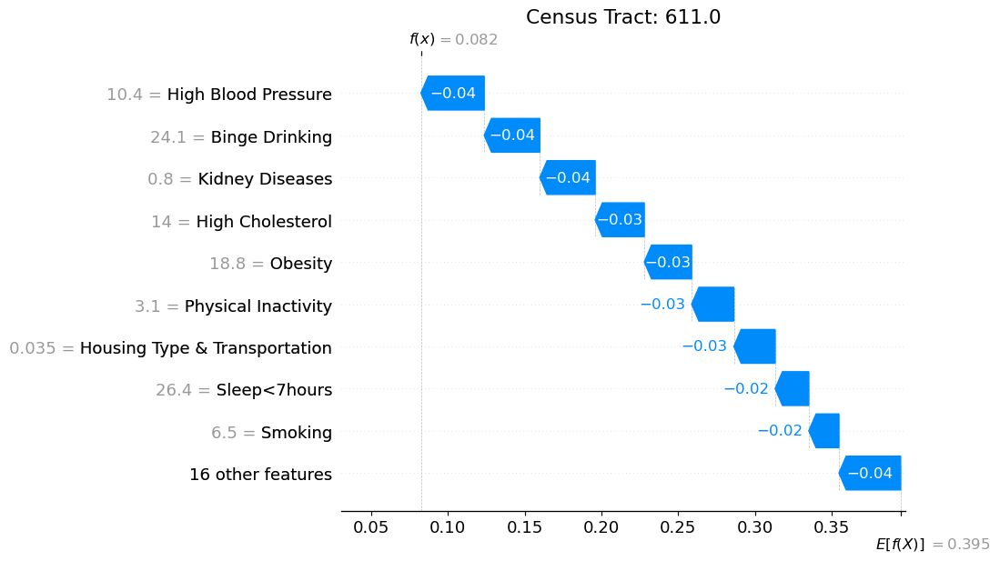

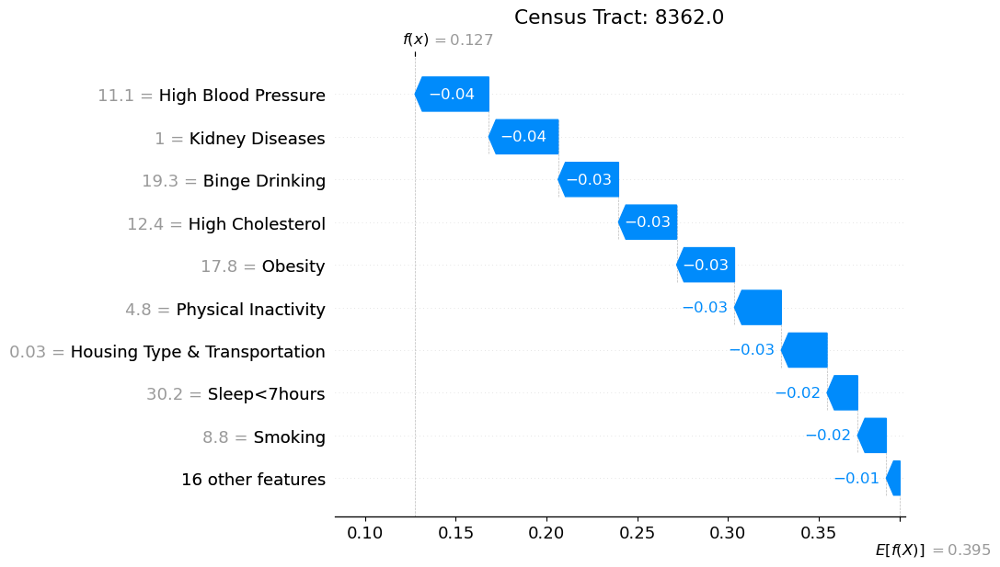

In [18]:
for i in range(len(X_v_low)):
    fig, ax = plt.subplots(figsize=(15, 16))
    shap.plots.waterfall(shap_explainer[X_v_low.index[i]], max_display=10, show=False)
    plt.title(f"Census Tract: {X_v_low.iloc[i]['NAME10']}")
    fig.savefig(f"../../Data/saved_data/Census Tract/Low_{X_v_low.iloc[i]['NAME10']}.jpg", dpi=300, bbox_inches='tight')
    plt.show()

In [19]:
shap_explainer[X_moderate.index[0]]

.values =
array([ 0.01017919, -0.00226949,  0.02035735,  0.00287925, -0.00147082,
        0.00229894,  0.01431358, -0.01154577, -0.00069422, -0.00830211,
       -0.00025281,  0.00367654,  0.00076613,  0.00041829,  0.00199449,
        0.00630881,  0.0101704 ,  0.00176154,  0.00137373,  0.00066532,
        0.00147295,  0.00040292,  0.00035112, -0.00041089,  0.00055642])

.base_values =
0.3949502071489724

.data =
array([ 1.83000000e+01,  1.42000000e+01,  1.27000000e+01,  3.57000000e+01,
        1.71673820e+01,  2.71000000e+01,  3.70000000e+01,  2.65000000e+01,
        1.59000000e+01,  3.10000000e+00,  2.24340000e+01,  1.07033500e+01,
        1.54834998e+03,  4.18333000e+00,  8.28625000e+01,  9.76305000e-01,
        9.92092000e-01,  7.24171000e-01,  2.85395000e-01, -3.62166000e-01,
        1.79268000e-04,  3.41162000e-02,  2.78977000e-04,  1.06751000e-04,
        1.44794000e-01])

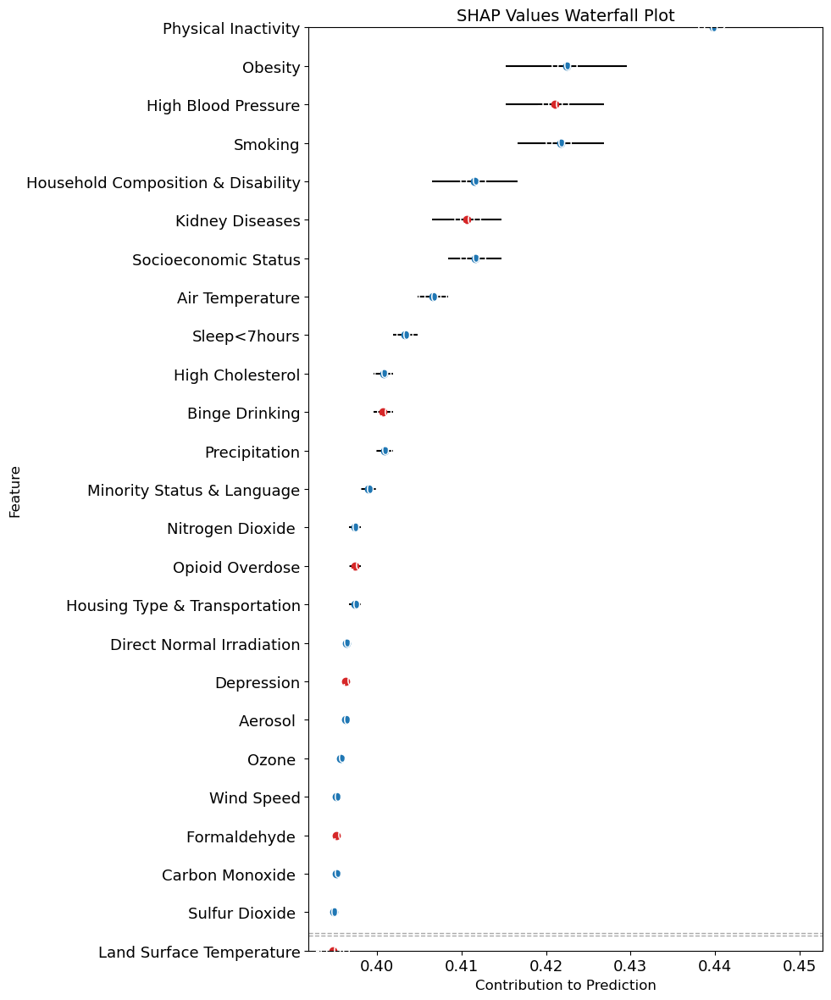

In [29]:


shap_values = shap_explainer[X_moderate.index[0]].values

# Define the feature names
feature_names = X.columns[1:]

# Calculate the base value and the final prediction value
base_value = shap_explainer[X_moderate.index[0]].base_values
final_value = base_value + np.sum(shap_values)


# Sort the SHAP values in descending order of absolute value
sort_inds = np.argsort(np.abs(shap_values))#[::-1]
sorted_shap_values = shap_values[sort_inds]
sorted_feature_names = np.array(feature_names)[sort_inds]

# Define the colors for positive and negative contributions
colors = ['#1f77b4' if val >= 0 else '#d62728' for val in sorted_shap_values]

# Create the waterfall plot
fig, ax = plt.subplots(figsize=(10, 12))

# Plot the base value
ax.axhline(y=base_value, linestyle='--', color='#AAAAAA', linewidth=1)
# ax.text(-0.1, base_value, 'Base Value', ha='right', va='center', fontsize=12)

# Plot the feature contributions
for i, (shap_val, name, color) in enumerate(zip(sorted_shap_values, sorted_feature_names, colors)):
    y_start = base_value + np.sum(sorted_shap_values[:i])
    y_end = y_start + shap_val
    ax.errorbar(x=(y_start + y_end) / 2, y=name, xerr=shap_val / 2, fmt='o', color=color, ecolor='black')
    ax.text(y_start + 0.5 * (y_end - y_start), i, f'{shap_val:.2f}', ha='center', va='center', color='white', fontsize=12)

# Plot the final prediction value
ax.axhline(y=final_value, linestyle='--', color='#AAAAAA', linewidth=1)
# ax.text(-0.1, final_value, 'Final Prediction', ha='right', va='center', fontsize=12)

# Set the axis labels and title
ax.set_xlabel('Contribution to Prediction', fontsize=12)
ax.set_ylabel('Feature', fontsize=12)
ax.set_title('SHAP Values Waterfall Plot', fontsize=14)

# Set the y-axis limits
ax.set_ylim([sorted_feature_names[0], sorted_feature_names[-1]])
plt.tight_layout()
# Show the plot
plt.show()

In [16]:
y = pd.DataFrame(model.predict(X.iloc[:, 1:]), index=X['NAME10'])
y.reset_index(inplace=True)

In [17]:
y.columns = ['NAME10', 'vul']

In [18]:
y['vul'] = MinMaxScaler().fit_transform(y[['vul']])

In [19]:
y[y["NAME10"] == 318.00]

,NAME10,vul
263,318.0,0.09487


In [20]:
y[y['vul'] < 0.05].sort_values(by='vul')

,NAME10,vul
326,611.00,0.000000
325,610.00,0.005930
539,703.00,0.006978
541,710.00,0.007215
369,634.00,0.008246
328,622.00,0.010949
543,612.00,0.012247
544,615.00,0.012923
478,629.00,0.012980
710,2405.00,0.014454


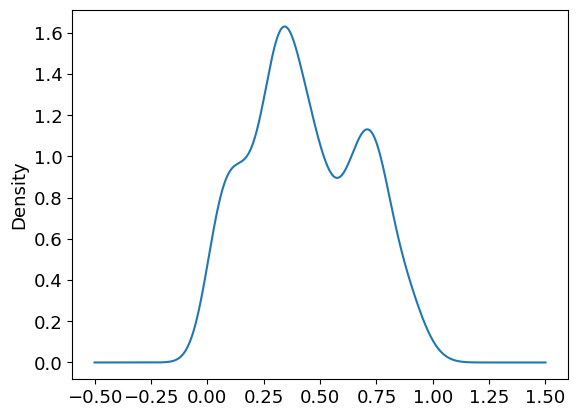

In [21]:
y['vul'].plot(kind='kde')
plt.show()

In [22]:
import shap

In [23]:
help(shap)

Help on package shap:

NAME
    shap - # flake8: noqa

PACKAGE CONTENTS
    _cext
    _explanation
    _serializable
    actions (package)
    benchmark (package)
    datasets
    explainers (package)
    links
    maskers (package)
    models (package)
    plots (package)
    utils (package)

SUBMODULES
    other

CLASSES
    builtins.object
        UnsupportedModule
    
    class UnsupportedModule(builtins.object)
     |  Methods defined here:
     |  
     |  __getattribute__(self, item)
     |      Return getattr(self, name).
     |  
     |  ----------------------------------------------------------------------
     |  Data descriptors defined here:
     |  
     |  __dict__
     |      dictionary for instance variables (if defined)
     |  
     |  __weakref__
     |      list of weak references to the object (if defined)

FUNCTIONS
    unsupported(*args, **kwargs)
        # plotting (only loaded if matplotlib is present)

DATA
    have_matplotlib = True

VERSION
    0.41.0

FIL

In [24]:
help(shap.plots)

Help on package shap.plots in shap:

NAME
    shap.plots

PACKAGE CONTENTS
    _bar
    _beeswarm
    _benchmark
    _decision
    _embedding
    _force
    _force_matplotlib
    _group_difference
    _heatmap
    _image
    _labels
    _monitoring
    _partial_dependence
    _scatter
    _text
    _utils
    _violin
    _waterfall
    colors (package)

FILE
    /Users/karanjogi/opt/miniconda3/envs/catboost/lib/python3.10/site-packages/shap/plots/__init__.py




[0.09486978]
[[0.09]
 [0.14]
 [0.19]
 [0.24]
 [0.29]
 [0.34]
 [0.39]]


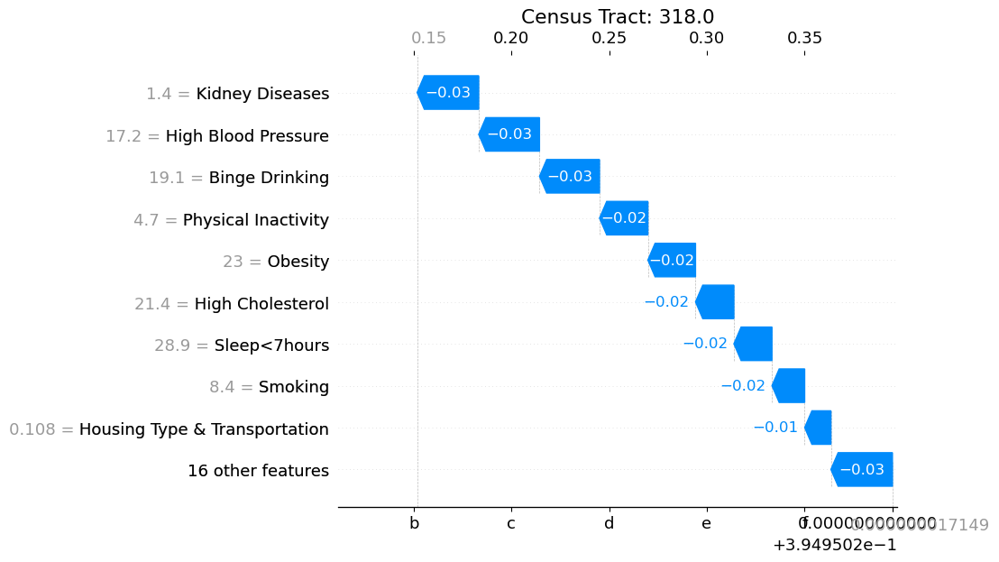

In [25]:
for i in range(len(X_v_low)):
    fig, ax = plt.subplots(figsize=(15, 16))
    shap_values = shap_explainer[X_v_low.index[i]].values
    base_value = shap_explainer[X_v_low.index[i]].base_values
    fx = np.round(base_value + np.sum(shap_values), 2)
#     print(fx)
    vul = y[y['NAME10'] == X_v_low.iloc[i]['NAME10']]['vul'].values
    scaling_factor = np.round(vul/fx, 6)
#     print(scaling_factor)
    print(vul)
    shap.plots.waterfall(shap_explainer[X_v_low.index[i]], max_display=10, show=False)
    plt.title(f"Census Tract: {X_v_low.iloc[i]['NAME10']}")
#     print(ax.get_shared_x_axes)
#     xtick_labels = [2*float(label.get_text()) for label in ax.get_xticklabels()]
#     ax.set_xticklabels(xtick_labels)
    print(np.round(np.linspace(vul, base_value, len(ax.get_xticklabels())), 2))
#     ax.set_xticklabels(np.round(np.linspace(vul, base_value, 6), 2))
    ax.set_xticklabels(['a', 'b', 'c', 'd', 'e', 'f', 'g'])
#     fig.savefig(f"../../Data/saved_data/Census Tract/Low_{X_v_low.iloc[i]['NAME10']}.jpg", dpi=300, bbox_inches='tight')
    plt.show()
    break

In [72]:
y

,NAME10,Diabetes
0,8314.00,15.2
1,8214.02,13.8
2,313.00,11.5
3,301.01,10.3
4,301.02,8.4
...,...,...
796,7709.02,8.9
797,8104.00,7.5
798,7608.01,10.6
799,7608.02,11.8


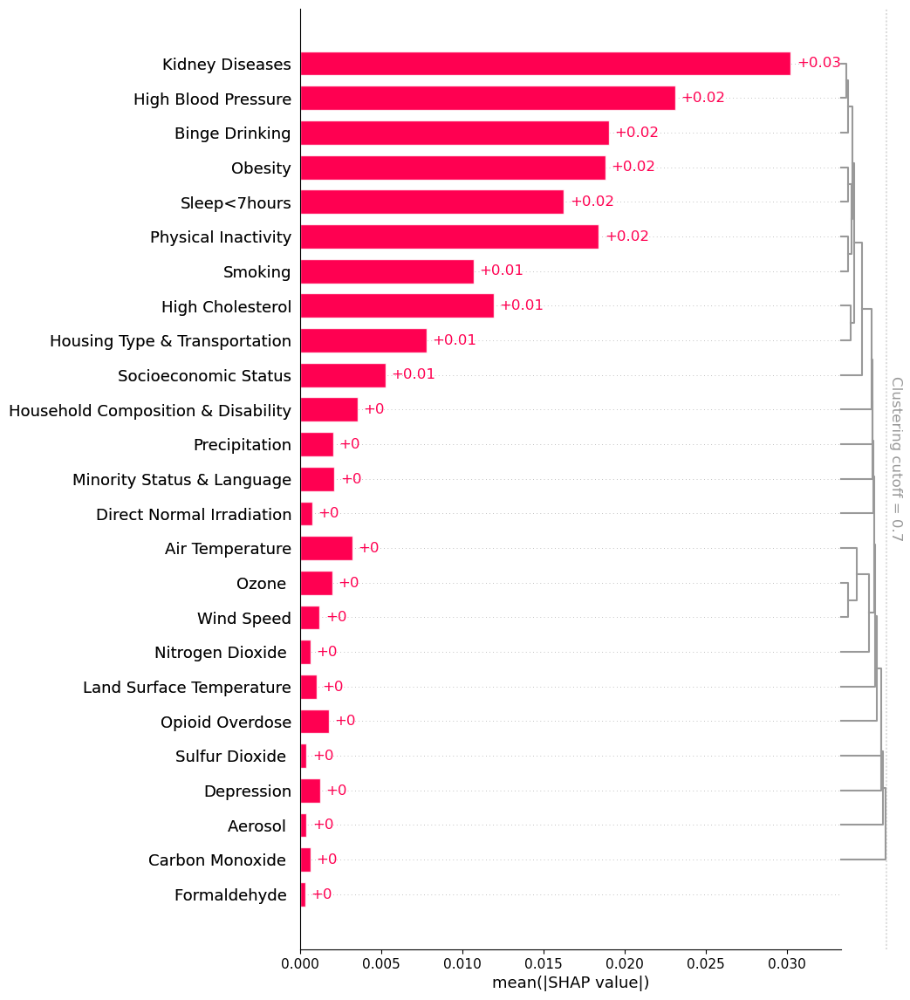

In [76]:
clustering = shap.utils.hclust(X.iloc[:,1:], y.iloc[:,1])
shap.plots.bar(shap_explainer, max_display=25, clustering=clustering, clustering_cutoff=0.7)

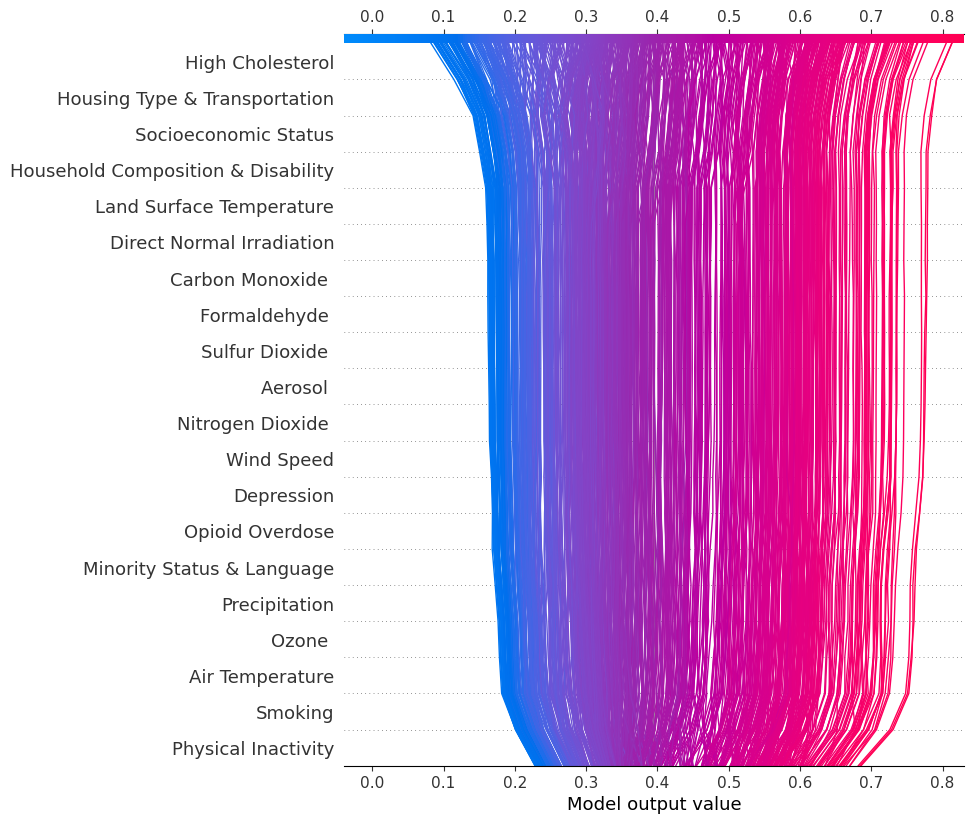

In [65]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values, X.columns[1:], feature_order='hclust')

In [ ]:
for i in range(len(X_v_high)):
    shap.plots.waterfall(shap_explainer[X_v_high.index[i]], max_display=25)

In [ ]:
for i in range(len(X_v_high)):
    shap.plots.waterfall(shap_explainer[X_v_high.index[i]], max_display=25)

In [ ]:
for i in range(len(X_v_high)):
    shap.plots.waterfall(shap_explainer[X_v_high.index[i]], max_display=25)

In [50]:
X_v_high.index[0]

366

In [48]:
X_v_high.iloc[0,:].index.values

array(['NAME10', 'Smoking', 'Binge Drinking', 'Physical Inactivity',
       'Sleep<7hours', 'Opioid Overdose', 'High Cholesterol', 'Obesity',
       'High Blood Pressure', 'Depression', 'Kidney Diseases',
       'Land Surface Temperature', 'Air Temperature',
       'Direct Normal Irradiation', 'Wind Speed', 'Precipitation',
       'Socioeconomic\xa0Status', 'Household Composition & Disability',
       'Minority Status & Language', 'Housing Type & Transportation',
       'Aerosol ', 'Nitrogen Dioxide ', 'Carbon Monoxide ',
       'Sulfur Dioxide ', 'Formaldehyde ', 'Ozone '], dtype=object)